In [1]:
import matplotlib.pyplot as plt
import pandas as p
import seaborn as sns
import numpy as np
%matplotlib inline

from scipy.stats import linregress
from scipy.spatial import distance
from matplotlib import colors
import scipy
import sys
import os
from matplotlib.backends.backend_pdf import PdfPages
# from sklearn.decomposition import PCA
from ast import literal_eval
from Bio import SeqIO
from itertools import combinations

%load_ext autoreload
%autoreload 2 

atish_assay_path = '../FitnessMeasurements/fitness_assay_grantedits.py'
sys.path.append(os.path.dirname(os.path.expanduser(atish_assay_path)))
import fitness_assay_grantedits as atish

tools_path = '../code/tools.py'
sys.path.append(os.path.dirname(os.path.expanduser(tools_path)))
import tools as tools

sns.set_color_codes()
sns.set_style('white')
sns.set_style('ticks')

In [2]:
p.set_option('display.max_columns', 50)

In [3]:
rebarcoding_source_mutants = {
'IRA1_MIS':'CGCTAAAGACATAATGTGGTTTGTTG_CTTCCAACAAAAAATCATTTTTATAC', # BCID 43361 from venkataram 2016
'IRA1_NON':'CGCTAAAGACATAATGTGGTTTGTTG_AGAGTAATCTGCAAGATTCTTTTTCT', # BCID 21967 from venkataram 2016
'CYR1':    'CGCTAAAGACATAATGTGGTTTGTTG_CTCGAAACAGGAAAAGCACTTATCGA', # BCID 43692 from venkataram 2016
'TOR1':    'CGCTAAAGACATAATGTGGTTTGTTG_TAGACAAAATGCAATTGTATTGTCAG' , # BCID 21543 from venkataram 2016
'GPB2':    'CGCTAAAGACATAATGTGGTTTGTTG_TCATGAACGGATAAGCTGGTTGGTTG' , # BCID 7774 from venkataram 2016
}



new_lowcomplexity_dict = {
#     'EVO1D_IRAs':[
# #         'CATAAAAAGACTAATCTTATTAATGC', # 74D-2 (Ira1 mis)
#                   'AATGCAATAATGAAATGATTTGAGGA',
# #                  'TGTACAAATCTTAAGAAGATTACAAG',  #YP 12 (IRA1 non)
#                   'GAAATAAACCACAACGACATTCTAAT',
# #                   'CCTACAAATACTAAGGCTATTCCTAT', #YP 10 (IRA1 non)
#                  ]
    
    'EVO1D_IRA1_MIS':['CATAAAAAGACTAATCTTATTAATGC'],
    
    'EVO1D_IRA1_NON':['CCTACAAATACTAAGGCTATTCCTAT','TGTACAAATCTTAAGAAGATTACAAG',
                     'AATGCAATAATGAAATGATTTGAGGA','GAAATAAACCACAACGACATTCTAAT'],
    
#     'EVO1D_TCG':['CCGCCAATCCCGAACCCCGTTTCGCC','GACAGAAAAGCCAAATGGATTTACCG',
#  'ATCAGAAGTTCGAATCAAATTACGAA','CCAACAAAAGGAAACGTATTTATTGA',
#  'TTAAAAATACAAAAAAAGATTTAAGG','AGAACAAAAACTAAACTCATTCATGG',
#  'ACTTAAAAAGCAAACATGATTATTCA','GTATTAAAATTAAAAATAATTGCACA',
#  'CTAGAAATCTCAAAAACTTTTGGCTG','CAGAAAAGCCATAACGCTATTTGAAA'],
    
    'EVO2D_IRA1_NON':['CCAACAAAACACAAATCTGTTGTGTA'],

    'EVO2D_IRA1_MIS':['TGATCAATCTACAAAAATATTTAATG','CATTGAATCACAAAATAGGTTAGATG'],

    'EVO3D_IRA1_NON':['ATCACAATAACTAAACTGATTCTTCA'],

    'EVO3D_IRA1_MIS':['TATCGAAACCCAAAGAGATTTAATCG'],

    'CYR1':['AGAACAAAAACTAAACTCATTCATGG','GACAGAAAAGCCAAATGGATTTACCG',
           'CTAGAAATCTCAAAAACTTTTGGCTG','ACTTAAAAAGCAAACATGATTATTCA',
            'CAGAAAAGCCATAACGCTATTTGAAA'],
    
    'GPB2':['CCGCCAATCCCGAACCCCGTTTCGCC','GTATTAAAATTAAAAATAATTGCACA',
            'CCAACAAAAGGAAACGTATTTATTGA'],
    
    'TOR1':['ATCAGAAGTTCGAATCAAATTACGAA','TTAAAAATACAAAAAAAGATTTAAGG'],
    

}

new_lowcomplexity_bc_to_entry_dict = {}

for key,items in new_lowcomplexity_dict.items():
    for bc in items:
        new_lowcomplexity_bc_to_entry_dict[bc] = key

new_lowcomplexity_barcodes = [item for key,items in new_lowcomplexity_dict.items() for item in items ]

In [4]:
previous_sources = p.read_csv('barcodes_previously_used.csv')



In [5]:
np.unique(previous_sources['source_publication'].values,return_counts=True)

(array(['Aggeli2020', 'Li2019', 'Venkataram2015'], dtype=object),
 array([2517,  669, 4571]))

In [6]:
previous_sources.columns

Index(['barcode', 'barcode_lowcomplexity', 'barcode_highcomplexity', 'cloneID',
       'source_publication', 'evolution_condition', 'ancestor', 'class',
       'ploidy', 'gene', 'type', 'additional_muts', '1D_Fitness_Li2019',
       '1D_Error_Li2019', '2D_Fitness_Li2019', '2D_Error_Li2019',
       '3D_Fitness_Li2019', '3D_Error_Li2019', '5D_Fitness_Li2019',
       '5D_Error_Li2019', 'FerPerHour_Li2019', 'ResPerHour_Li2019',
       'StaPerHour_Li2019'],
      dtype='object')

In [7]:
li_df = previous_sources[(previous_sources['source_publication']=='Li2019')]

li_neutral_df = previous_sources[(previous_sources['source_publication']=='Li2019')&(previous_sources['class']=='neutral_haploids')]

li_neutral_df[~p.isnull(li_neutral_df['cloneID'])]



,barcode,barcode_lowcomplexity,barcode_highcomplexity,cloneID,source_publication,evolution_condition,ancestor,class,ploidy,gene,type,additional_muts,1D_Fitness_Li2019,1D_Error_Li2019,2D_Fitness_Li2019,2D_Error_Li2019,3D_Fitness_Li2019,3D_Error_Li2019,5D_Fitness_Li2019,5D_Error_Li2019,FerPerHour_Li2019,ResPerHour_Li2019,StaPerHour_Li2019
1529,ATCTTAAATTTTAATTACATTTACAT_TATGAAATTCAAAAGTTAT...,ATCTTAAATTTTAATTACATTTACAT,TATGAAATTCAAAAGTTATTTTCGAT,GWS-P1-H8,Li2019,Evo5D,WT,neutral_haploids,Haploid,POX1,DOWNSTREAM,IX-Gain,-0.048306,0.055014,0.043562,0.053979,0.172658,0.120223,-0.043154,0.078133,-0.003976,0.003828,-0.004496
1780,GTAATAAGAAGTAAGATGATTCTATT_CATCAAATAACTAATATAT...,GTAATAAGAAGTAAGATGATTCTATT,CATCAAATAACTAATATATTTTGCTT,GWS-P2-D8,Li2019,Evo1_5D,WT,neutral_haploids,Haploid,other,other,YBR113W-FRAME_SHIFT; IX-Gain; NRD1-SYNONYMOUS_...,-0.012902,0.044823,0.005762,0.044616,0.050210,0.101804,0.031248,0.052532,-0.001001,0.000778,-0.000395
1784,GTAATAAGAAGTAAGATGATTCTATT_CCAATAAGATCCAACCATG...,GTAATAAGAAGTAAGATGATTCTATT,CCAATAAGATCCAACCATGTTCTTTA,GWS-P2-G8,Li2019,Evo1_5D,WT,neutral_haploids,Haploid,other,other,IX-Gain; NRD1-SYNONYMOUS_CODING,-0.040404,0.052338,-0.036987,0.050099,-0.049733,0.111625,-0.064000,0.103000,-0.002561,0.000142,-0.000297
1805,GTAATAAGAAGTAAGATGATTCTATT_CGCACAAATCGGAAGTAAT...,GTAATAAGAAGTAAGATGATTCTATT,CGCACAAATCGGAAGTAATTTTTATT,GWS-P3-C8,Li2019,Evo1_5D,WT,neutral_haploids,Haploid,other,other,IX-Gain; NRD1-SYNONYMOUS_CODING; YKR073C-UPSTREAM,0.002168,0.051717,0.084581,0.049966,0.138718,0.112926,-0.021000,0.102000,-0.000723,0.003434,-0.003327
1820,GTAATAAGAAGTAAGATGATTCTATT_CTCGTAAACTTGAAGGGCG...,GTAATAAGAAGTAAGATGATTCTATT,CTCGTAAACTTGAAGGGCGTTGGAAG,GWS-P3-B9,Li2019,Evo1_5D,WT,neutral_haploids,Haploid,other,other,IX-Gain; YER138W-A-UPSTREAM,0.027626,0.050387,0.007033,0.048267,-0.056950,0.108093,0.094059,0.058129,0.001941,-0.000858,0.003146
1947,GTAATAAGAAGTAAGATGATTCTATT_TGAACAACAACGAAAACTA...,GTAATAAGAAGTAAGATGATTCTATT,TGAACAACAACGAAAACTATTCGCTT,GWS-P2-E12,Li2019,Evo1_5D,WT,neutral_haploids,Haploid,other,other,IX-Gain; NRD1-SYNONYMOUS_CODING; MRL1-SYNONYMO...,0.002625,0.043294,0.089855,0.042139,0.047035,0.099024,0.066146,0.049045,-0.000745,0.003635,0.000398
2038,TGACAAAAATTGAAGACTTTTCAGGT_AAGCGAATGTACAAGTGAC...,TGACAAAAATTGAAGACTTTTCAGGT,AAGCGAATGTACAAGTGACTTTGAGA,GWS-P1-A8,Li2019,Evo1D,WT,neutral_haploids,Haploid,other,other,IX-Gain; CCA1-UPSTREAM; YEL020C-DOWNSTREAM,-0.010167,0.051904,0.023735,0.051572,0.018577,0.113886,0.014607,0.069647,-0.000989,0.001413,-0.000083
2073,TTTAGAAAAATCAACAATTTTAATTG_AACATAAACGTAAACATGG...,TTTAGAAAAATCAACAATTTTAATTG,AACATAAACGTAAACATGGTTTCAGG,GWS-P2-B10,Li2019,Evo5D,WT,neutral_haploids,Haploid,other,other,IX-Gain; VPH1-NON_SYNONYMOUS_CODING; DBF2-DOWN...,0.000373,0.051728,0.255448,0.043091,0.228050,0.098563,0.065205,0.050988,-0.002634,0.010628,-0.003393


In [8]:
venkataram_neutral_df = previous_sources[(previous_sources['source_publication']=='Venkataram2015')&(previous_sources['class']=='neutral_haploids')]

venkataram_neutral_df[~p.isnull(venkataram_neutral_df['cloneID'])]

,barcode,barcode_lowcomplexity,barcode_highcomplexity,cloneID,source_publication,evolution_condition,ancestor,class,ploidy,gene,type,additional_muts,1D_Fitness_Li2019,1D_Error_Li2019,2D_Fitness_Li2019,2D_Error_Li2019,3D_Fitness_Li2019,3D_Error_Li2019,5D_Fitness_Li2019,5D_Error_Li2019,FerPerHour_Li2019,ResPerHour_Li2019,StaPerHour_Li2019
2192,CGCTAAAGACATAATGTGGTTTGTTG_TGAAGAACCGGGAAGCATG...,CGCTAAAGACATAATGTGGTTTGTTG,TGAAGAACCGGGAAGCATGTTAGAAC,130822-1-C3,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,-0.070947,0.135580,-0.064111,0.205505,0.083016,0.152202,-0.111435,0.133738,-0.004505,0.000285,-0.004051
2199,CGCTAAAGACATAATGTGGTTTGTTG_TACATAACAATGAATCTAG...,CGCTAAAGACATAATGTGGTTTGTTG,TACATAACAATGAATCTAGTTTAGGT,131016-4-F10,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,0.023433,0.153394,0.175142,0.261163,0.192645,0.241544,0.085358,0.139775,-0.000116,0.006321,-0.002235
2206,CGCTAAAGACATAATGTGGTTTGTTG_TATCGAACAGAAAAGCTCT...,CGCTAAAGACATAATGTGGTTTGTTG,TATCGAACAGAAAAGCTCTTTGCCGC,131016-6-H9,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,0.011616,0.135678,0.019031,0.213456,0.115690,0.165906,-0.065206,0.131149,0.000649,0.000309,-0.003769
2214,CGCTAAAGACATAATGTGGTTTGTTG_AATTTAAACTGTAAGCCGC...,CGCTAAAGACATAATGTGGTTTGTTG,AATTTAAACTGTAAGCCGCTTGGTTT,131010-3-B8,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,other,NotSequenced,NotSequenced,-0.008589,0.124457,0.138234,0.159041,0.177676,0.113973,-0.129591,0.102445,-0.002066,0.006118,-0.006401
2217,CGCTAAAGACATAATGTGGTTTGTTG_AGTTCAAGTTGCAAGGGGT...,CGCTAAAGACATAATGTGGTTTGTTG,AGTTCAAGTTGCAAGGGGTTTACCCG,131016-5-C2,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,other,NotSequenced,NotSequenced,-0.060785,0.140718,-0.075932,0.223770,-0.088117,0.178881,-0.132068,0.131436,-0.003641,-0.000631,-0.000916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5234,CGCTAAAGACATAATGTGGTTTGTTG_CAAGCAAGCCCTAAGTTGC...,CGCTAAAGACATAATGTGGTTTGTTG,CAAGCAAGCCCTAAGTTGCTTCTGAA,130712-1-G8,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,0.018416,0.149831,0.102043,0.337967,0.665834,0.329979,-0.051648,0.166640,0.000280,0.003484,-0.014948
5235,CGCTAAAGACATAATGTGGTTTGTTG_GCCATAATGAGAAATCGTG...,CGCTAAAGACATAATGTGGTTTGTTG,GCCATAATGAGAAATCGTGTTAAGTG,131024-1-E6,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,-0.030056,0.158424,-0.238360,0.353973,-0.008301,0.247338,-0.181529,0.173610,0.000291,-0.008679,-0.003609
5236,CGCTAAAGACATAATGTGGTTTGTTG_TCAATAAAATAAAATAAAG...,CGCTAAAGACATAATGTGGTTTGTTG,TCAATAAAATAAAATAAAGTTGTATC,131101-1-A3,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,-0.112808,0.159105,-0.792848,0.434369,-0.304946,0.386474,-0.153548,0.172265,0.000033,-0.028335,0.003154
5238,CGCTAAAGACATAATGTGGTTTGTTG_TCAAAAATAAGTAAGCGTC...,CGCTAAAGACATAATGTGGTTTGTTG,TCAAAAATAAGTAAGCGTCTTGTCTA,131213-1-H8,Venkataram2015,Evo2D,WT,neutral_haploids,Haploid,NotSequenced,NotSequenced,NotSequenced,0.090258,0.135724,-0.012543,0.228679,-0.090683,0.178167,-0.187337,0.144158,0.006712,-0.004283,-0.002014


In [13]:
bc_counts = p.read_csv('2%5%_FitnessMeasurement_barcode_counts_withsequence.csv')

print(len(bc_counts))

bc_counts = bc_counts.merge(previous_sources,on=['barcode','barcode_lowcomplexity','barcode_highcomplexity'],how='left')
print(len(bc_counts))
# keep only barcodes that have at least min # of reads in min # of columns
min_reads = 10
min_columns = 10

bc_counts['source_publication'] = [source if not p.isnull(source) else 'This_study' for source in bc_counts['source_publication']]

# bc_counts = bc_counts[np.count_nonzero(bc_counts) > min_reads,axis=1) > min_columns]

bc_counts = bc_counts[bc_counts['BCID'] != 9999999]

fit_cols = [col for col in bc_counts if 'Fit' in col and 'Li2019' not in col]



bc_counts = bc_counts.iloc[np.where(np.count_nonzero(bc_counts[fit_cols],axis=1)>5)[0],:]

10308
10308


In [14]:
conditions = ['Fit1D-2%','Fit1D-5%',
              'Fit2D-2%','Fit2D-5%',
              'Fit3D-2%','Fit3D-5%',
              'Fit5D-2%','Fit5D-5%']

# replicates = [1,2,3]
replicates = {'Fit1D-2%':[1,2],
              'Fit1D-5%':[1,2],
              'Fit2D-2%':[1,2],
              'Fit2D-5%':[1,2],
              'Fit3D-2%':[1,2,3],
              'Fit3D-5%':[1,2,3],
              'Fit5D-2%':[1,2,3],
              'Fit5D-5%':[1,2,3]}

timepoints = {'Fit1D-2%':7,
              'Fit1D-5%':7,
              'Fit2D-2%':7,
              'Fit2D-5%':7,
              'Fit3D-2%':3,
              'Fit3D-5%':3,
              'Fit5D-2%':3,
              'Fit5D-5%':3}

In [15]:



for condition in conditions:
    t = 0
    this_timepoint = f'{condition}-T0'
    relevant_columns = [col for col in bc_counts.columns if this_timepoint in col]
    print(this_timepoint,relevant_columns)
    bc_counts[f'{this_timepoint}_combined'] = np.sum(bc_counts[relevant_columns],axis=1)
    for rep in replicates[condition]:
        for t in range(1,timepoints[condition]):
            this_timepoint = f'{condition}-R{rep}-T{t}'
            relevant_columns = [col for col in bc_counts.columns if this_timepoint in col]
            print(this_timepoint,relevant_columns)
            bc_counts[f'{this_timepoint}_combined'] = np.sum(bc_counts[relevant_columns],axis=1)



Fit1D-2%-T0 ['Fit1D-2%-T0']
Fit1D-2%-R1-T1 ['Fit1D-2%-R1-T1']
Fit1D-2%-R1-T2 ['Fit1D-2%-R1-T2']
Fit1D-2%-R1-T3 ['Fit1D-2%-R1-T3']
Fit1D-2%-R1-T4 ['Fit1D-2%-R1-T4']
Fit1D-2%-R1-T5 ['Fit1D-2%-R1-T5']
Fit1D-2%-R1-T6 ['Fit1D-2%-R1-T6']
Fit1D-2%-R2-T1 ['Fit1D-2%-R2-T1']
Fit1D-2%-R2-T2 ['Fit1D-2%-R2-T2']
Fit1D-2%-R2-T3 ['Fit1D-2%-R2-T3']
Fit1D-2%-R2-T4 ['Fit1D-2%-R2-T4']
Fit1D-2%-R2-T5 ['Fit1D-2%-R2-T5']
Fit1D-2%-R2-T6 ['Fit1D-2%-R2-T6']
Fit1D-5%-T0 ['Fit1D-5%-T0']
Fit1D-5%-R1-T1 ['Fit1D-5%-R1-T1']
Fit1D-5%-R1-T2 ['Fit1D-5%-R1-T2']
Fit1D-5%-R1-T3 ['Fit1D-5%-R1-T3']
Fit1D-5%-R1-T4 ['Fit1D-5%-R1-T4']
Fit1D-5%-R1-T5 ['Fit1D-5%-R1-T5']
Fit1D-5%-R1-T6 ['Fit1D-5%-R1-T6']
Fit1D-5%-R2-T1 ['Fit1D-5%-R2-T1']
Fit1D-5%-R2-T2 ['Fit1D-5%-R2-T2']
Fit1D-5%-R2-T3 ['Fit1D-5%-R2-T3']
Fit1D-5%-R2-T4 ['Fit1D-5%-R2-T4']
Fit1D-5%-R2-T5 ['Fit1D-5%-R2-T5']
Fit1D-5%-R2-T6 ['Fit1D-5%-R2-T6']
Fit2D-2%-T0 ['Fit2D-2%-T0']
Fit2D-2%-R1-T1 ['Fit2D-2%-R1-T1']
Fit2D-2%-R1-T2 ['Fit2D-2%-R1-T2']
Fit2D-2%-R1-T3 ['Fit2D-2%-R1-T3'

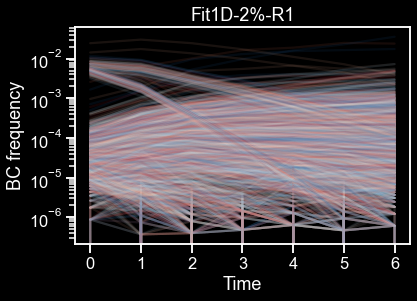

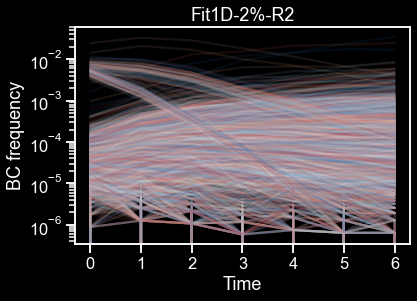

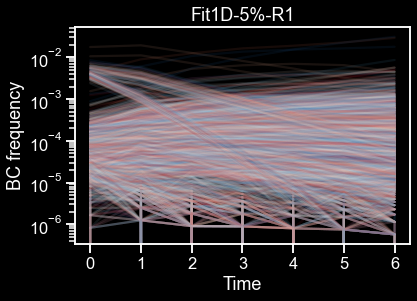

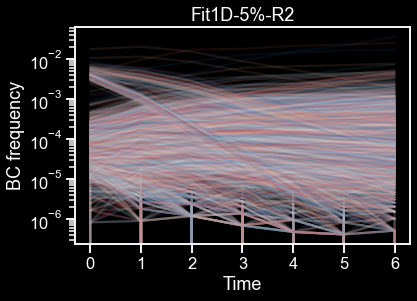

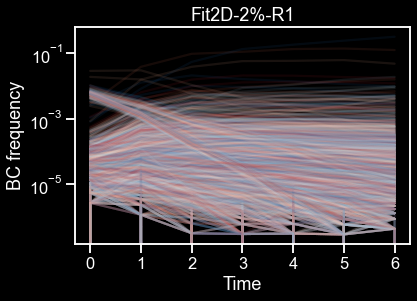

...

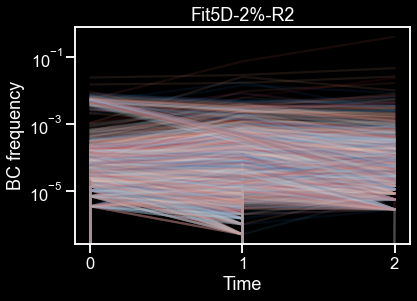

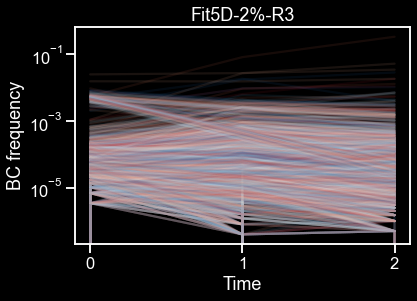

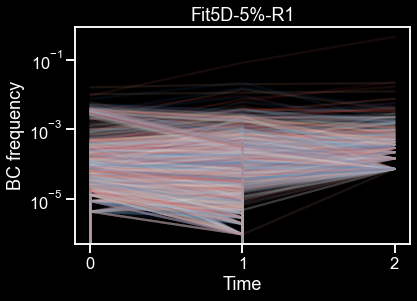

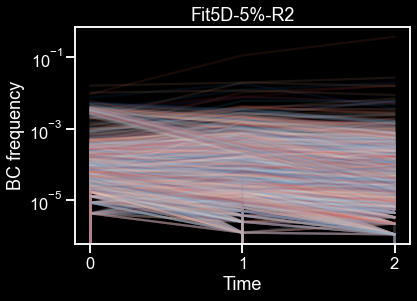

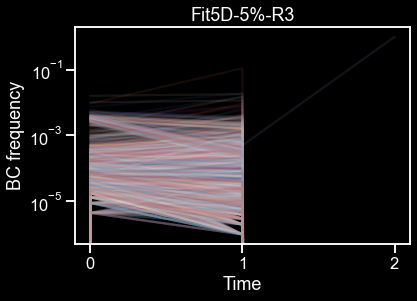

In [26]:
# non_neutral_indices = np.where(~bc_counts['barcode'].isin(neutra))[0]
plt.style.use('dark_background')
sns.set_context('talk')
sns.set_palette('RdBu',8)


conditions = ['Fit1D-2%','Fit1D-5%',
              'Fit2D-2%','Fit2D-5%',
              'Fit3D-2%','Fit3D-5%',
              'Fit5D-2%','Fit5D-5%']
# condition = 'Fit2D'
# condition = 'Fit3D'
# condition = 'Fit5D'


# replicates = [1,2,3]
for condition in conditions:
    for rep in replicates[condition]:
        plt.figure()
        rep_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]

        these_counts = bc_counts[rep_times].values # get rid of ancestor sequence
        these_freqs = these_counts/np.nansum(these_counts,axis=0)

        plt.plot(range(timepoints[condition]),these_freqs.swapaxes(0,1)[:,:],alpha=0.1)
        plt.yscale('log')
        plt.ylabel('BC frequency')
        
        plt.xticks(range(timepoints[condition]),range(timepoints[condition]))
        plt.xlabel('Time')
        
        plt.title(f'{condition}-R{rep}')

        plt.savefig(f'{condition}-R{rep}_frequencytrajectories_reducedBCs_DARK.pdf',bbox_inches='tight')

In [20]:
sns.color_palette('RdBu',16)

[(0.5769319492502883, 0.05536332179930796, 0.14925028835063436),
 (0.7229527104959631, 0.14394463667820068, 0.19215686274509805),
 (0.805997693194925, 0.3100346020761245, 0.2705882352941176),
 (0.8807381776239908, 0.4719723183391003, 0.3753171856978085),
 (0.9499423298731257, 0.6311418685121106, 0.49757785467128013),
 (0.9755478662053056, 0.7591695501730102, 0.6530565167243365),
 (0.9893886966551326, 0.8717416378316032, 0.8025374855824683),
 (0.9755478662053056, 0.9363321799307959, 0.9132641291810842),
 (0.92479815455594, 0.9478662053056517, 0.960553633217993),
 (0.8371395617070359, 0.9063437139561707, 0.9444059976931949),
 (0.7033448673587084, 0.8389850057670128, 0.9079584775086506),
 (0.5543252595155715, 0.7610149942329878, 0.8643598615916958),
 (0.37208765859284904, 0.6456747404844292, 0.8020761245674741),
 (0.23137254901960785, 0.5349480968858131, 0.7434832756632064),
 (0.15294117647058825, 0.4311418685121108, 0.6904267589388697),
 (0.08419838523644753, 0.31280276816609, 0.5534025374855824)]

NameError: name 'source' is not defined

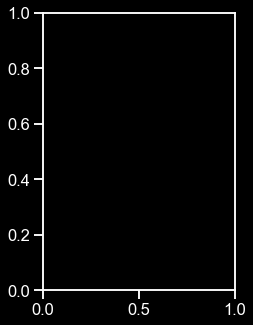

In [25]:



# conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']
# conditions = ['Fit2D']
# condition = 'Fit2D'
# condition = 'Fit3D'
# condition = 'Fit5D'

# colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in merged_fitness['source_publication']]

publications = [['This_study','Venkataram2015','Li2019','Aggeli2020'],['Venkataram2015'],['Li2019'],['Aggeli2020'],['This_study']]
# replicates = [1,2,3]

pub_names = ['All mutants','Venkataram2016 mutants','Li2019 mutants','Aggeli2020 mutants','This study mutants']


for condition in conditions:
    plt.figure(figsize=(4*len(publications),6*len(replicates)))
    for rep in replicates[condition]:
        
        rep_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]

        these_counts = bc_counts[rep_times].values # get rid of ancestor sequence
        these_freqs = these_counts/np.nansum(these_counts,axis=0)
        
        for p,pub_set in enumerate(publications):
            
            ax = plt.subplot(len(replicates),len(publications),(rep-1)*len(publications)+p+1)
            
            pub_indices = np.where(bc_counts['source_publication'].isin(pub_set))[0]
            
#             these_colors = 
        
#             these_colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in bc_counts['source_publication'].values[pub_indices]]
#             ax.set_color_cycle(these_colors)
            if source == 'This_study':
                sns.set_palette('Blues',8)
            elif source == 'Li2019':
                sns.set_palette('Reds',8)
            elif source == 'Aggeli2020':
                sns.set_palette('Oranges',8)
            else:
                sns.set_palette('Greens',8)
                
            plt.plot(range(timepoints[condition]),these_freqs.swapaxes(0,1)[:,pub_indices],alpha=0.03)
            plt.yscale('log')
            plt.ylabel('BC frequency')
            
            if p == 0:
                ymin,ymax = plt.ylim()
            else:
                plt.ylim(ymin,ymax)

            plt.xticks(range(timepoints[condition]),range(timepoints[condition]))
            plt.xlabel('Time')

            plt.title(f'{condition}-R{rep} {pub_names[p]}')
    
    plt.tight_layout()
    plt.savefig(f'{condition}_frequencytrajectories_byPubSource_alpha03_DARK.pdf',bbox_inches='tight')

In [ ]:
np.sum(bc_counts[['Fit2D-T0_combined','Fit2D-R1-T1_combined']],axis=0)

In [ ]:
bc_counts[bc_counts['gene']=='IRA1'][['Fit2D-T0_combined','Fit2D-R1-T1_combined']]

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: The set_color_cycle function was deprecated in version 1.5. Use `.set_prop_cycle` instead.
  


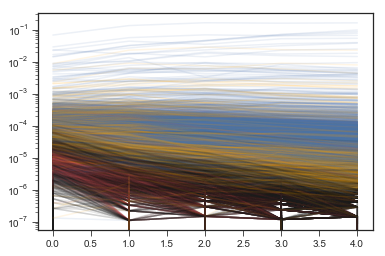

In [31]:
ax = plt.subplot()
ax.set_color_cycle(these_colors)
plt.plot(these_freqs.swapaxes(0,1)[:,pub_indices],alpha=0.1)
plt.yscale('log')

Fit1D-2%-R1
[1131360 2682119 2486930 2054235 1548880 2124383 1620416]
Fit1D-2%-R2
[1131360  792279  928244 1706371 1335088 1566235 1557673]
Fit1D-5%-R1
[1214356  802070 1103960 1119756 1249566 1331234 1746737]
Fit1D-5%-R2
[1214356 1116462  839732 1457444 2101378 2431331 1956533]
Fit2D-2%-R1
[ 378292  875750 3227900 3397404 3287339 3496000 2340652]
Fit2D-2%-R2
[ 378292 1483105 1518102 2539811 2133386 2299096 2131766]
Fit2D-5%-R1
[ 853619 1947200 3243678 3180074 4807979 3475998  248493]
Fit2D-5%-R2
[ 853619 3482426 2248927 3928045 3902815 3716726 3174599]
Fit3D-2%-R1
[515233 632575 720633]
Fit3D-2%-R2
[ 515233 2108400 2502847]
Fit3D-2%-R3
[ 515233 1885462 1420254]
Fit3D-5%-R1
[ 562711 1669919     132]
Fit3D-5%-R2
[ 562711 2215856 1193927]
Fit3D-5%-R3
[ 562711 1639821 2081823]
Fit5D-2%-R1
[ 290792 1751543 1186519]
Fit5D-2%-R2
[ 290792 2015406  360679]
Fit5D-2%-R3
[ 290792 2488674 1981884]
Fit5D-5%-R1
[ 230015 1040839   13731]
Fit5D-5%-R2
[230015 792347 887538]
Fit5D-5%-R3
[ 230015 1040098

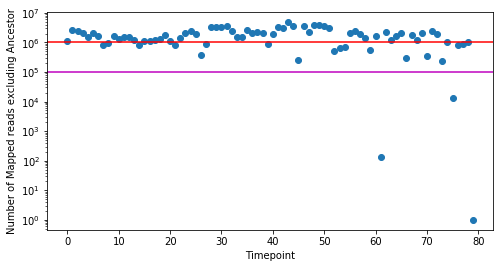

In [33]:
# conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']
# replicates = [1,2,3]

rep_times = []

for condition in conditions:
    rep_times = rep_times + [f'{condition}-T0_combined']
    for rep in replicates[condition]:
        rep_times = rep_times + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]
        
        these_counts = bc_counts[[f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]].values
        print(f'{condition}-R{rep}')
        print(np.nansum(these_counts,axis=0))
        

these_counts = bc_counts[rep_times].values
#         these_freqs = np.nansum(these_counts,axis=0)

plt.figure(figsize=(8,4))
plt.plot(np.nansum(these_counts,axis=0),linestyle='',marker='o')
plt.yscale('log')
# for i in range(len(conditions)-1):
    
#     plt.axvline(x=13*(i+1)-0.5,color='k',alpha=0.5)
    
plt.ylabel('Number of Mapped reads excluding Ancestor')
plt.xlabel('Timepoint')

plt.axhline(10**6,color='r')
plt.axhline(10**5,color='m')

# plt.xticks([13*(i)+13/2 for i in range(len(conditions))],conditions)
# plt.xlim(-1,13*len(conditions))
# plt.axvline(x=)
#         plt.plot(range(5),these_freqs.swapaxes(0,1)[:,:],alpha=0.1)
#         plt.yscale('log')
#         plt.ylabel('BC frequency')
plt.savefig('Coverage.pdf',bbox_inches='tight')

In [9]:
# conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']
# condition = 'Fit2D'
# condition = 'Fit3D'
# condition = 'Fit5D'

# replicates = [1,2,3]

fig = plt.figure(figsize=(6*len(replicates),4*len(conditions)))
for c,condition in enumerate(conditions):
    for r,rep in enumerate(replicates):
        plt.subplot(len(conditions),len(replicates),len(replicates)*c+r+1)
        
        rep_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,5)]

        these_counts = bc_counts[rep_times].values # get rid of ancestor sequence
        these_freqs = these_counts/np.nansum(these_counts,axis=0)

        plt.plot(range(5),these_freqs.swapaxes(0,1)[:,:],alpha=0.1)
        plt.yscale('log')
        plt.ylabel('BC frequency')
        
        plt.xticks(range(5),range(5))
        plt.xlabel('Time')
        
        plt.title(f'{condition}-R{rep}')
        
plt.subplots_adjust(hspace=0.25, wspace=0.25)

plt.savefig(f'bestlist_ALL_frequencytrajectories_reducedBCs.pdf',bbox_inches='tight')

10179

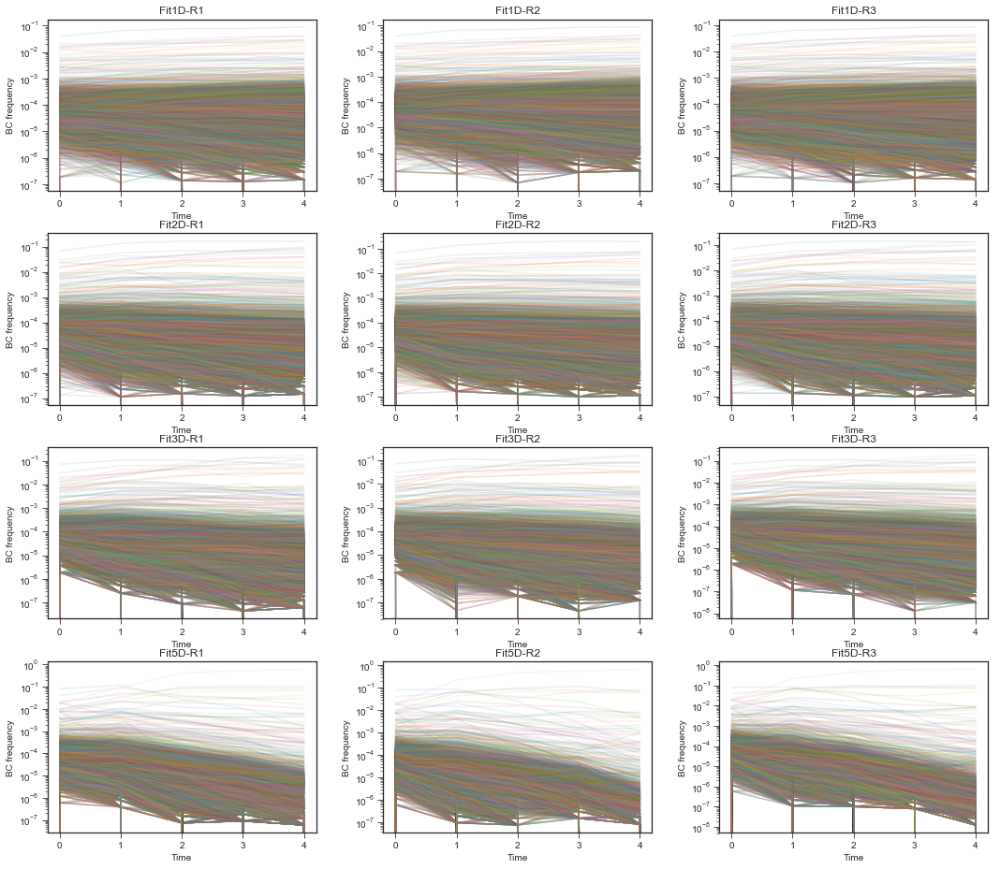

In [10]:
# conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']
# condition = 'Fit2D'
# condition = 'Fit3D'
# condition = 'Fit5D'

# replicates = [1,2,3]

fig = plt.figure(figsize=(6*len(replicates),4*len(conditions)))
for c,condition in enumerate(conditions):
    for r,rep in enumerate(replicates):
        plt.subplot(len(conditions),len(replicates),len(replicates)*c+r+1)
        
        rep_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,5)]

        these_counts = bc_counts[rep_times].values # get rid of ancestor sequence
        these_freqs = these_counts/np.nansum(these_counts,axis=0)

        plt.plot(range(5),these_freqs.swapaxes(0,1)[:,:],alpha=0.1)
        plt.yscale('log')
        plt.ylabel('BC frequency')
        
        plt.xticks(range(5),range(5))
        plt.xlabel('Time')
        
        plt.title(f'{condition}-R{rep}')
        
plt.subplots_adjust(hspace=0.25, wspace=0.25)

plt.savefig(f'bestlist_ALL_frequencytrajectories_reducedBCs.pdf',bbox_inches='tight')

In [11]:
bc_counts[(bc_counts['class']=='neutral_haploids') & (bc_counts['evolution_condition'] == 'Evo2D') & (bc_counts['ancestor'] == 'WT')]

,BCID,Fit2D-R2-T3,Fit1D-R1-T2,Fit1D-R2-T1,Fit3D-R1-T2,Fit2D-R1-T1_PCRb,Fit1D-T0,Fit5D-R3-T1,Fit3D-R2-T1_PCRb,Fit2D-R1-T4,...,Fit5D-R1-T3_combined,Fit5D-R1-T4_combined,Fit5D-R2-T1_combined,Fit5D-R2-T2_combined,Fit5D-R2-T3_combined,Fit5D-R2-T4_combined,Fit5D-R3-T1_combined,Fit5D-R3-T2_combined,Fit5D-R3-T3_combined,Fit5D-R3-T4_combined
1105,1106,3,1,1,9,114,1,38,203,1,...,1,0,22,4,0,0,38,3,1,0
1135,1136,1,2,2,11,117,5,28,168,2,...,0,0,53,7,0,0,28,7,2,0
1259,1260,1,4,6,8,123,4,36,194,0,...,0,0,19,9,0,0,36,4,0,0
1291,1292,1,3,1,15,154,2,35,264,1,...,0,0,25,7,0,0,35,14,1,0
1411,1412,3,0,0,16,134,2,41,253,0,...,0,0,32,8,0,0,41,1,3,0
1412,1413,2,3,2,8,129,0,13,154,1,...,0,0,17,1,0,1,13,3,0,0
1478,1479,2,1,1,9,114,0,10,146,0,...,0,0,18,2,0,0,10,3,0,0
1491,1492,1,1,2,9,104,2,9,167,0,...,0,0,10,2,0,0,9,2,0,0
1541,1542,1,0,0,13,54,3,8,110,0,...,1,0,14,3,5,0,8,1,2,0
1571,1572,2,0,2,0,84,0,12,109,1,...,0,0,22,7,0,0,12,0,2,0


In [5]:
np.unique(bc_counts['source_publication'],return_counts=True)

(array(['Aggeli2020', 'Li2019', 'This_study', 'Venkataram2015'],
       dtype=object), array([2502,  668, 2540, 4469]))

In [6]:
np.unique(bc_counts[bc_counts['source_publication']=='Aggeli2020']['barcode_lowcomplexity'],return_counts=True)

(array(['ACTTAAAAAGCAAACATGATTATTCA', 'AGAACAAAAACTAAACTCATTCATGG',
        'ATCAGAAGTTCGAATCAAATTACGAA', 'CAGAAAAGCCATAACGCTATTTGAAA',
        'CCAACAAAAGGAAACGTATTTATTGA', 'CCGCCAATCCCGAACCCCGTTTCGCC',
        'CTAGAAATCTCAAAAACTTTTGGCTG', 'GACAGAAAAGCCAAATGGATTTACCG',
        'GTATTAAAATTAAAAATAATTGCACA', 'TTAAAAATACAAAAAAAGATTTAAGG'],
       dtype=object),
 array([ 67, 151, 339,  42, 422, 612,  41, 243, 187, 398]))

In [7]:
np.unique(bc_counts[bc_counts['source_publication']=='This_study']['barcode_lowcomplexity'],return_counts=True)

(array(['AATGCAATAATGAAATGATTTGAGGA', 'ACTTAAAAAGCAAACATGATTATTCA',
        'AGAACAAAAACTAAACTCATTCATGG', 'ATCACAATAACTAAACTGATTCTTCA',
        'ATCAGAAGTTCGAATCAAATTACGAA', 'CAGAAAAGCCATAACGCTATTTGAAA',
        'CATAAAAAGACTAATCTTATTAATGC', 'CATTGAATCACAAAATAGGTTAGATG',
        'CCAACAAAACACAAATCTGTTGTGTA', 'CCAACAAAAGGAAACGTATTTATTGA',
        'CCGCCAATCCCGAACCCCGTTTCGCC', 'CCTACAAATACTAAGGCTATTCCTAT',
        'CTAGAAATCTCAAAAACTTTTGGCTG', 'GAAATAAACCACAACGACATTCTAAT',
        'GACAGAAAAGCCAAATGGATTTACCG', 'GTATTAAAATTAAAAATAATTGCACA',
        'TATCGAAACCCAAAGAGATTTAATCG', 'TGATCAATCTACAAAAATATTTAATG',
        'TGTACAAATCTTAAGAAGATTACAAG', 'TTAAAAATACAAAAAAAGATTTAAGG'],
       dtype=object),
 array([133,  39,  98, 179, 160,  29, 238,  80, 262, 192, 319,   5,  25,
        117, 124, 110,  60, 123,  68, 179]))

In [15]:


neutrals = bc_counts[(bc_counts['class']=='neutral_haploids') & 
                     (bc_counts['evolution_condition'] == 'Evo2D') & 
                     (bc_counts['ancestor'] == 'WT')]['BCID'].values
li2019_neutrals = bc_counts[(bc_counts['class']=='neutral_haploids') & 
#                      (bc_counts['evolution_condition'] == 'Evo2D') & 
                     (bc_counts['source_publication']=='Li2019')]['BCID'].values

In [16]:
## Calculate percentage of population that is barcoded at each timepoint.
conditions = ['Fit1D-2%','Fit1D-5%',
              'Fit2D-2%','Fit2D-5%',
              'Fit3D-2%','Fit3D-5%',
              'Fit5D-2%','Fit5D-5%']
initial_fraction = {'Fit1D-2%':0.06, # BC pool is 2%, each neutral pool 2% 
                    'Fit1D-5%':0.09, # BC pool is 5%, each neutral pool 2% 
                    'Fit2D-2%':0.06,
                    'Fit2D-5%':0.09,
                    'Fit3D-2%':0.06,
                    'Fit3D-5%':0.09,
                    'Fit5D-2%':0.06,
                    'Fit5D-5%':0.09}
frac_barcoded = {}
frac_barcoded_adaptive = {}
reads = {}
# conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']
for condition in conditions:
    rep_times = {}
    r_timepoints = []
    
   
    
    for rep in replicates[condition]:
        
        these_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]
        these_timepoints = [t for t in range(timepoints[condition])]
        
        neutral_counts = np.sum(bc_counts[bc_counts['BCID'].isin(neutrals)][these_times].values,axis=0)
        li_neutral_counts = np.sum(bc_counts[bc_counts['BCID'].isin(li2019_neutrals)][these_times].values,axis=0)
        total_counts = np.sum(bc_counts[these_times].values,axis=0)
        
        neutral_fraction = neutral_counts/total_counts
        print(these_times,'\n',neutral_fraction)
        total_neutral_fraction = (neutral_counts+li_neutral_counts)/total_counts
        
        
        
        q = initial_fraction[condition]/(1-initial_fraction[condition])*neutral_fraction[0]
        
        frac_barcoded[f'{condition}-R{rep}'] = q/(q+neutral_fraction)
        frac_barcoded_adaptive[f'{condition}-R{rep}'] = (1-total_neutral_fraction)*q/(q+neutral_fraction)
        print((1-total_neutral_fraction)*q/(q+neutral_fraction))
        reads[f'{condition}-R{rep}'] = total_counts

['Fit1D-2%-T0_combined', 'Fit1D-2%-R1-T1_combined', 'Fit1D-2%-R1-T2_combined', 'Fit1D-2%-R1-T3_combined', 'Fit1D-2%-R1-T4_combined', 'Fit1D-2%-R1-T5_combined', 'Fit1D-2%-R1-T6_combined'] 
 [0.40817423 0.32771663 0.17123441 0.09120622 0.04393885 0.02093973
 0.0088576 ]
[0.01722497 0.04075246 0.10633027 0.20100092 0.35560941 0.54273765
 0.73965886]
['Fit1D-2%-T0_combined', 'Fit1D-2%-R2-T1_combined', 'Fit1D-2%-R2-T2_combined', 'Fit1D-2%-R2-T3_combined', 'Fit1D-2%-R2-T4_combined', 'Fit1D-2%-R2-T5_combined', 'Fit1D-2%-R2-T6_combined'] 
 [0.40817423 0.33300517 0.20104628 0.08988667 0.04492213 0.02010235
 0.00891522]
[0.01722497 0.04083591 0.08916385 0.20361184 0.35036862 0.55305295
 0.73840142]
['Fit1D-5%-T0_combined', 'Fit1D-5%-R1-T1_combined', 'Fit1D-5%-R1-T2_combined', 'Fit1D-5%-R1-T3_combined', 'Fit1D-5%-R1-T4_combined', 'Fit1D-5%-R1-T5_combined', 'Fit1D-5%-R1-T6_combined'] 
 [0.29844131 0.19904372 0.09509312 0.04644762 0.02180117 0.01024688
 0.00474656]
[0.04164956 0.09440147 0.21110581

In [18]:
plt.figure(figsize=(8,16))
for c,condition in enumerate(conditions):
    frac_adaptive = 0
    for rep in replicates[condition]:
        if rep == 1:
            avg = frac_barcoded_adaptive[f'{condition}-R{rep}']
        else:
            avg = avg + frac_barcoded_adaptive[f'{condition}-R{rep}']
    print(condition)
    print(avg/len(replicates[condition]))

Fit1D-2%
[0.01722497 0.04079418 0.09774706 0.20230638 0.35298902 0.5478953
 0.73903014]
Fit1D-5%
[0.04164956 0.09347713 0.19765373 0.36383071 0.55882    0.73266827
 0.86032727]
Fit2D-2%
[0.01731139 0.10380878 0.30898272 0.5243705  0.74596299 0.89568258
 0.9569142 ]
Fit2D-5%
[0.04330131 0.21925438 0.44500265 0.6300085  0.81614758 0.92276964
 0.96990912]
Fit3D-2%
[0.01883323 0.09669356 0.19480621]
Fit3D-5%
[0.04586008 0.11287684 0.17589641]
Fit5D-2%
[0.02395279 0.08976021 0.14447638]
Fit5D-5%
[0.0540853  0.13581383 0.49874389]


<Figure size 576x1152 with 0 Axes>

[0.01722497 0.04075246 0.10633027 0.20100092 0.35560941 0.54273765
 0.73965886]
[0.01722497 0.04083591 0.08916385 0.20361184 0.35036862 0.55305295
 0.73840142]
[0.04164956 0.09440147 0.21110581 0.36954193 0.56239084 0.73463715
 0.85736387]
[0.04164956 0.09255279 0.18420164 0.35811948 0.55524916 0.7306994
 0.86329068]
[0.01731139 0.10172209 0.31762821 0.53985712 0.75537585 0.90737452
 0.96139876]
[0.01731139 0.10589546 0.30033723 0.50888388 0.73655014 0.88399065
 0.95242963]
[0.04330131 0.21151309 0.4393123  0.60065396 0.79391834 0.90636545
 0.96389099]
[0.04330131 0.22699568 0.45069301 0.65936304 0.83837682 0.93917382
 0.97592725]
[0.01883323 0.09061159 0.17019244]
[0.01883323 0.09729939 0.22041091]
[0.01883323 0.10216969 0.19381527]
[0.04586008 0.10226765 0.12724069]
[0.04586008 0.12758302 0.17567414]
[0.04586008 0.10877984 0.22477439]
[0.02395279 0.08603633 0.16205973]
[0.02395279 0.08518133 0.11648135]
[0.02395279 0.09806297 0.15488807]
[0.0540853  0.13377667 0.20031265]
[0.0540853 

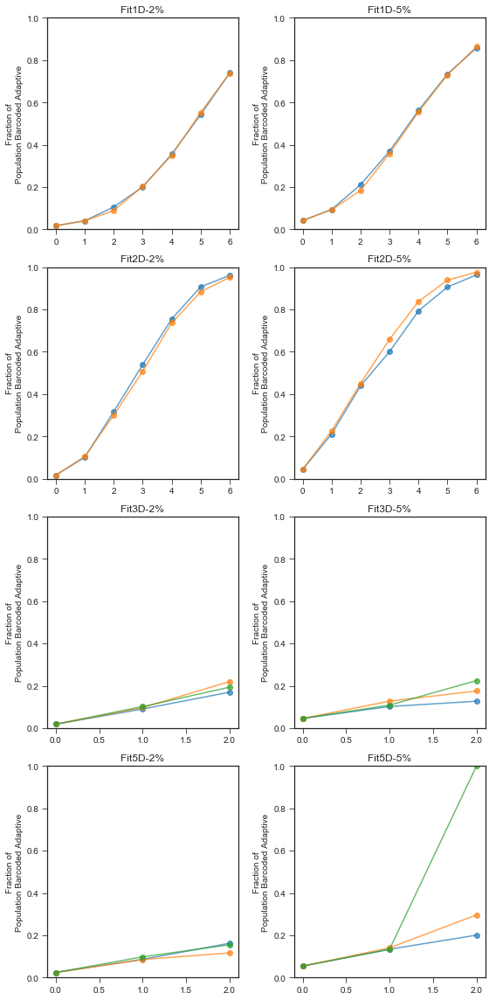

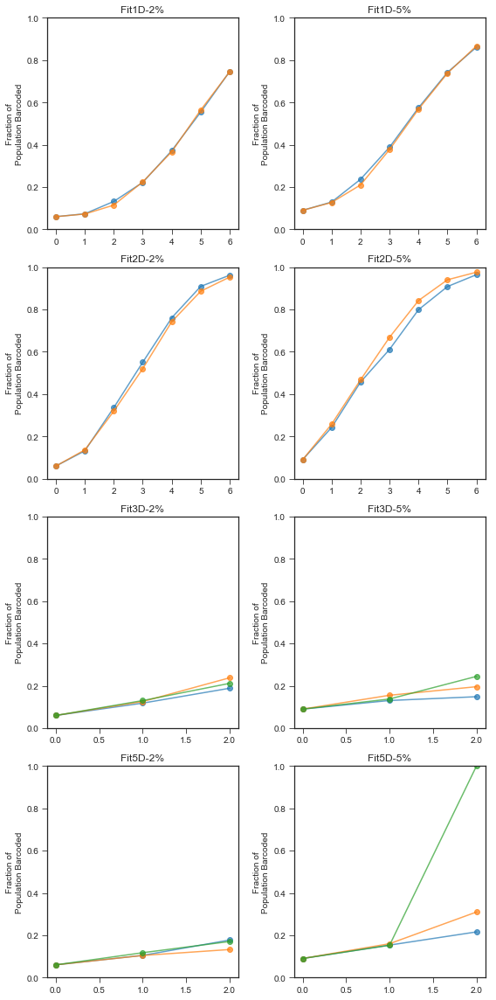

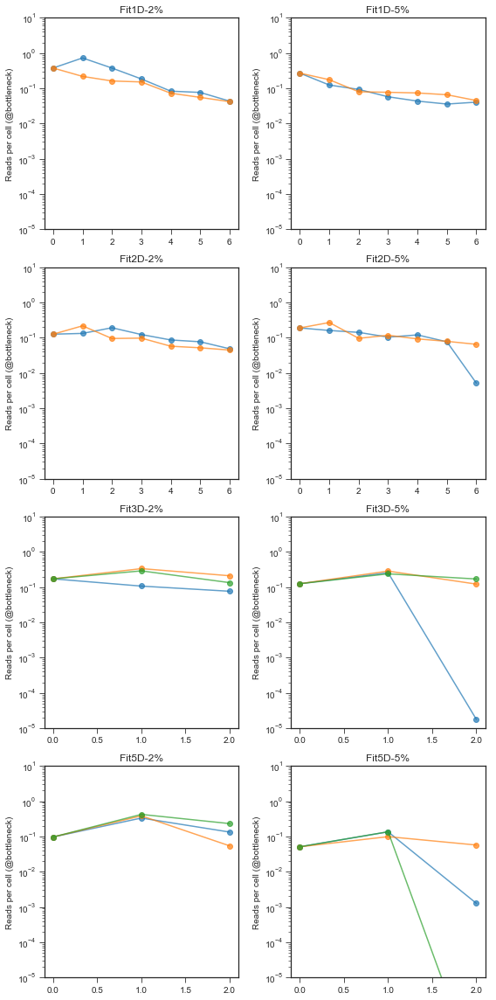

In [19]:
frac_barcoded
plt.figure(figsize=(8,16))
for c,condition in enumerate(conditions):
    plt.subplot(4,2,c+1)
    plt.title(condition)
    for rep in replicates[condition]:
        plt.plot(frac_barcoded_adaptive[f'{condition}-R{rep}'],marker='o',alpha=0.7)
        print(frac_barcoded_adaptive[f'{condition}-R{rep}'])
    plt.ylabel('Fraction of\nPopulation Barcoded Adaptive')
    plt.ylim(0,1)
plt.tight_layout()
plt.savefig('fraction_barcoded_adaptive.pdf',bbox_inches='tight')

plt.figure(figsize=(8,16))
for c,condition in enumerate(conditions):
    plt.subplot(4,2,c+1)
    plt.title(condition)
    for rep in replicates[condition]:
        plt.plot(frac_barcoded[f'{condition}-R{rep}'],marker='o',alpha=0.7)
        print(frac_barcoded[f'{condition}-R{rep}'])
    plt.ylabel('Fraction of\nPopulation Barcoded')
    plt.ylim(0,1)
plt.tight_layout()
plt.savefig('fraction_barcoded.pdf',bbox_inches='tight')

plt.figure(figsize=(8,16))
for c,condition in enumerate(conditions):
    plt.subplot(4,2,c+1)
    plt.title(condition)
    for rep in replicates[condition]:
        print(reads[f'{condition}-R{rep}']/(frac_barcoded[f'{condition}-R{rep}']*5*10**7))
        plt.plot(reads[f'{condition}-R{rep}']/(frac_barcoded[f'{condition}-R{rep}']*5*10**7),marker='o',alpha=0.7)
    plt.ylabel('Reads per cell (@bottleneck)')
    plt.yscale('log')
    plt.ylim(10**-5,10)
plt.tight_layout()
plt.savefig('CoverageRatio.pdf',bbox_inches='tight')


# plt.

In [40]:
import scipy.optimize as opt
def logistic_f(x, k, mid):
    return 1 / (1. + np.exp(-k * (x - mid))) 

def logistic_solve(y,k,mid):
    return -1.0/k *np.log((1-y)/y) + mid

In [60]:
# remove_swaps = True
# weighted = True
# save_output = True


# save_for_later_dict = {}


# cov_thresh = 10**5


# fitnesses = {}

# cols_to_remove = []

# for condition in conditions:
#     rep_times = {}
#     r_timepoints = []
#     for rep in replicates[condition]:
        
#         these_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]
#         these_timepoints = [t for t in range(timepoints[condition])]
        
                    
#         r_timepoints.append(these_timepoints)
        
#         rep_times[rep] = np.nan_to_num(bc_counts[these_times].values,0)
        
#         for entry in these_times:
#             cols_to_remove.append(entry) # don't include the count files in the final fitness dataframe
        
#         print(f'{condition}-R{rep}')
#         print(np.sum(rep_times[rep],axis=0))
#     print(f'{condition}')
#     answer = atish.inferFitness(bc_counts['BCID'].values,these_timepoints,rep_times,
#                                 neutralBarcodes=li2019_neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=False,useMultNoise=True,weightedMean=weighted)
    
    
#     for rep in replicates[condition]:
#         save_for_later_dict[rep] = answer[rep]

#     for rep in replicates[condition]:
        
#         fitnesses[f'{condition}-R{rep}_fitness'] = answer[rep]['aveFitness']
#         fitnesses[f'{condition}-R{rep}_error'] = answer[rep]['aveError']


# fitness_df_li2019neutrals = p.DataFrame(fitnesses)
# fitness_df_li2019neutrals = fitness_df_li2019neutrals.replace([np.inf, -np.inf], np.nan)

# for col in [column for column in bc_counts.columns if column not in cols_to_remove]:
#     fitness_df_li2019neutrals[col] = bc_counts[col].values

# for condition in conditions:
    
#     fitness_df_li2019neutrals[f'{condition}_fitness'] = np.nansum([fitness_df_li2019neutrals[f'{condition}-R{rep}_fitness'].values/fitness_df_li2019neutrals[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0) \
#     /np.nansum([1.0/fitness_df_li2019neutrals[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0)
    
#     fitness_df_li2019neutrals[f'{condition}_error'] = np.nansum([1.0/fitness_df_li2019neutrals[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0)**(-1)

# fitness_df_li2019neutrals = fitness_df_li2019neutrals.dropna(subset = [col for col in fitness_df_li2019neutrals.columns if '_fitness' in col])

# # fitness_df = fitness_df[[col for col in fitness_df if col not in other_info]]



Fit1D-2%-R1
[1131360 2682119 2486930 2054235 1548880 2124383 1620416]
Fit1D-2%-R2
[1131360  792279  928244 1706371 1335088 1566235 1557673]
Fit1D-2%
neutrals inside 228
neutral reads True 15.0 12.0
neutral reads True 12.0 3.0
low median - neutral reads 1399.0 257.3464912280702
neutral reads True 3.0 0.0
low median - neutral reads 257.3464912280702 37.37280701754386
neutral reads True 0.0 0.0
low median - neutral reads 37.37280701754386 4.9298245614035086
neutral reads True 0.0 0.0
low median - neutral reads 4.9298245614035086 1.0833333333333333


../FitnessMeasurements/fitness_assay_grantedits.py:235: RuntimeWarning: divide by zero encountered in power
  zScores = zScores*np.power(expectedReads,-0.5)
../FitnessMeasurements/fitness_assay_grantedits.py:235: RuntimeWarning: invalid value encountered in multiply
  zScores = zScores*np.power(expectedReads,-0.5)
../FitnessMeasurements/fitness_assay_grantedits.py:406: RuntimeWarning: divide by zero encountered in log
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
../FitnessMeasurements/fitness_assay_grantedits.py:406: RuntimeWarning: invalid value encountered in subtract
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
../FitnessMeasurements/fitness_assay_grantedits.py:411: RuntimeWarning: divide by zero encountered in power
  allTimeErrors = np.sqrt(np.power(allReads[repName][:,1:]/kappas,-1)
../FitnessMeasurements/fitness_assay_grantedits.py:455: RuntimeW

neutral reads True 0.0 0.0
low median - neutral reads 1.0833333333333333 0.12719298245614036
neutral reads False 15.0 12.0
neutral reads False 12.0 3.0
low median - neutral reads 1405.1453744493392 258.4757709251101
neutral reads False 3.0 0.0
low median - neutral reads 258.4757709251101 37.5374449339207
neutral reads False 0.0 0.0
low median - neutral reads 37.5374449339207 4.951541850220265
neutral reads False 0.0 0.0
low median - neutral reads 4.951541850220265 1.0881057268722467
neutral reads False 0.0 0.0
low median - neutral reads 1.0881057268722467 0.1277533039647577
neutral reads True 15.0 3.0
low median - neutral reads 1512.1666666666667 362.1359649122807
neutral reads True 3.0 1.0
low median - neutral reads 362.1359649122807 88.53508771929825
neutral reads True 1.0 0.0
low median - neutral reads 88.53508771929825 30.153508771929825
neutral reads True 0.0 0.0
low median - neutral reads 30.153508771929825 3.504385964912281
neutral reads True 0.0 0.0
low median - neutral reads 3

../FitnessMeasurements/fitness_assay_grantedits.py:231: RuntimeWarning: divide by zero encountered in log
  -np.log(finalReads/Rfinal)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3194: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/_method

 228
neutral reads True 5.0 1.0
low median - neutral reads 818.0482456140351 222.14912280701753
neutral reads True 1.0 0.0
low median - neutral reads 222.14912280701753 28.526315789473685
neutral reads False 5.0 1.0
low median - neutral reads 818.0482456140351 222.14912280701753
neutral reads False 1.0 0.0
low median - neutral reads 222.14912280701753 28.526315789473685
neutral reads True 5.0 2.0
low median - neutral reads 818.0482456140351 772.6491228070175
neutral reads True 2.0 0.0
low median - neutral reads 772.6491228070175 92.15789473684211
neutral reads False 5.0 2.0
low median - neutral reads 818.0482456140351 772.6491228070175
neutral reads False 2.0 0.0
low median - neutral reads 772.6491228070175 92.15789473684211
neutral reads True 5.0 2.0
low median - neutral reads 818.0482456140351 648.438596491228
neutral reads True 2.0 0.0
low median - neutral reads 648.438596491228 51.08771929824562
neutral reads False 5.0 2.0
low median - neutral reads 818.0482456140351 648.4385964912

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:58: RuntimeWarning: divide by zero encountered in reciprocal


In [37]:
remove_swaps = True
weighted = True
save_output = True


save_for_later_dict = {}

cov_thresh = 10**5

fitnesses = {}
time_fitnesses = {}

cols_to_remove = []

# n_timepoints = 5
# n_timepoints = 4

for condition in conditions:
    rep_times = {}
    r_timepoints = []
    for rep in replicates[condition]:
        
        these_times = [f'{condition}-T0_combined'] + [f'{condition}-R{rep}-T{t}_combined' for t in range(1,timepoints[condition])]
        these_timepoints = [t for t in range(timepoints[condition])]
        
                    
        r_timepoints.append(timepoints)
        
        rep_times[rep] = np.nan_to_num(bc_counts[these_times].values,0)
        
        for entry in these_times:
            cols_to_remove.append(entry) # don't include the count files in the final fitness dataframe
        
        print(f'{condition}-R{rep}')
        print(np.sum(rep_times[rep],axis=0))
    print(f'{condition}')
    answer = atish.inferFitness(bc_counts['BCID'].values,these_timepoints,rep_times,
                                neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=False,useMultNoise=True,weightedMean=weighted)
    
    
    for rep in replicates[condition]:
        save_for_later_dict[rep] = answer[rep]

    for rep in replicates[condition]:
        
        fitnesses[f'{condition}-R{rep}_fitness'] = answer[rep]['aveFitness']
        fitnesses[f'{condition}-R{rep}_error'] = answer[rep]['aveError']
        time_fitnesses[f'{condition}-R{rep}_fitness'] = answer[rep]['allTimeFitness']
        time_fitnesses[f'{condition}-R{rep}_error'] = answer[rep]['allTimeErrors']


fitness_df = p.DataFrame(fitnesses)
fitness_df = fitness_df.replace([np.inf, -np.inf], np.nan)

# fitness_df_time = p.DataFrame(time_fitnesses)
# fitness_df_time = fitness_df_time.replace([np.inf, -np.inf], np.nan)

for col in [column for column in bc_counts.columns if column not in cols_to_remove]:
    fitness_df[col] = bc_counts[col].values

for condition in conditions:
    
    fitness_df[f'{condition}_fitness'] = np.nansum([fitness_df[f'{condition}-R{rep}_fitness'].values/fitness_df[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0) \
    /np.nansum([1.0/fitness_df[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0)
    
    fitness_df[f'{condition}_error'] = np.nansum([1.0/fitness_df[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0)**(-1)

# remove barcodes if ever is nan for a fitness value
fitness_df = fitness_df.dropna(subset = [col for col in fitness_df.columns if '_fitness' in col])

# fitness_df = fitness_df[[col for col in fitness_df if col not in other_info]]


Fit1D-2%-R1
[1131360 2682119 2486930 2054235 1548880 2124383 1620416]
Fit1D-2%-R2
[1131360  792279  928244 1706371 1335088 1566235 1557673]
Fit1D-2%
neutrals inside 154
neutral reads True 51.0 133.5
neutral reads True 133.5 69.0
neutral reads True 69.0 36.0
neutral reads True 36.0 14.5
neutral reads True 14.5 11.0
neutral reads True 11.0 3.0
low median - neutral reads 288.85714285714283 93.2012987012987
neutral reads False 41.0 108.5
neutral reads False 108.5 54.0
neutral reads False 54.0 26.0
neutral reads False 26.0 10.0
neutral reads False 10.0 6.0
low median - neutral reads 11.166666666666666 8.217948717948717
neutral reads False 6.0 2.0
low median - neutral reads 8.217948717948717 2.5128205128205128
neutral reads True 51.0 42.5
neutral reads True 42.5 30.5
neutral reads True 30.5 25.0
neutral reads True 25.0 12.0
neutral reads True 12.0 7.5
low median - neutral reads 389.44805194805195 204.44805194805195
neutral reads True 7.5 4.0
low median - neutral reads 204.44805194805195 90.1

../FitnessMeasurements/fitness_assay_grantedits.py:235: RuntimeWarning: divide by zero encountered in power
  zScores = zScores*np.power(expectedReads,-0.5)
../FitnessMeasurements/fitness_assay_grantedits.py:235: RuntimeWarning: invalid value encountered in multiply
  zScores = zScores*np.power(expectedReads,-0.5)
../FitnessMeasurements/fitness_assay_grantedits.py:406: RuntimeWarning: divide by zero encountered in log
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
../FitnessMeasurements/fitness_assay_grantedits.py:406: RuntimeWarning: invalid value encountered in subtract
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
../FitnessMeasurements/fitness_assay_grantedits.py:411: RuntimeWarning: divide by zero encountered in power
  allTimeErrors = np.sqrt(np.power(allReads[repName][:,1:]/kappas,-1)
../FitnessMeasurements/fitness_assay_grantedits.py:455: RuntimeW

neutral reads False 5.0 2.0
low median - neutral reads 27.6 13.7375
Multiplicative noise consistency checks

1  inconsistent times:

kappas [10.29825452  3.37630886  3.50382392  7.28246842  5.50131133  1.64897779]
multNoise [0.08605612 0.0999364  0.14613213 0.06262187 0.08650448 0.06005033]
No clear inconsistencies


2  inconsistent times:

kappas [7.84804836 2.64440205 2.91037467 8.55070085 2.07132585 1.6563103 ]
multNoise [0.08605612 0.0999364  0.14613213 0.06262187 0.08650448 0.06005033]
No clear inconsistencies

Fit1D-5%-R1
[1214356  802070 1103960 1119756 1249566 1331234 1746737]
Fit1D-5%-R2
[1214356 1116462  839732 1457444 2101378 2431331 1956533]
Fit1D-5%
neutrals inside 154
neutral reads True 90.0 54.5
neutral reads True 54.5 41.0
neutral reads True 41.0 22.0
neutral reads True 22.0 12.0
neutral reads True 12.0 7.0
low median - neutral reads 176.8961038961039 88.57792207792208
neutral reads True 7.0 5.0
low median - neutral reads 88.57792207792208 53.83766233766234
neutral read

neutral reads True 35.0 26.0
neutral reads False 42.0 29.0
neutral reads False 29.0 21.0
Multiplicative noise consistency checks

1  inconsistent times:

kappas [295.29057186]
multNoise [0.10121593]
No clear inconsistencies


2  inconsistent times:

kappas [456.21212083  10.93316747]
multNoise [0.10121593 0.10121593]
0


3  inconsistent times:

kappas [467.22416177  10.40367332]
multNoise [0.10121593 0.10121593]
0

Fit5D-2%-R1
[ 290792 1751543 1186519]
Fit5D-2%-R2
[ 290792 2015406  360679]
Fit5D-2%-R3
[ 290792 2488674 1981884]
Fit5D-2%
neutrals inside 154
neutral reads True 13.0 21.0
neutral reads True 21.0 8.0
low median - neutral reads 1766.2792207792209 649.2987012987013
neutral reads False 15.0 23.0
neutral reads False 23.0 10.0
neutral reads True 13.0 20.0
neutral reads True 20.0 4.0
low median - neutral reads 2040.987012987013 278.6818181818182
neutral reads False 15.0 21.0
neutral reads False 21.0 5.0
low median - neutral reads 2064.93893129771 272.5267175572519
neutral reads Tr

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: divide by zero encountered in reciprocal


In [16]:
bc_counts['BCID'].values[np.where(np.isin(bc_counts['BCID'].values,li2019_neutrals))]

array([ 6129,  7393,  7489,  7661,  7737,  7978,  8029,  8137,  8352,
        8362,  8374,  8391,  8429,  8480,  8646,  8705,  8728,  8730,
        8757,  8780,  8796,  8836,  8874,  8898,  8899,  8907,  8910,
        8911,  8923,  8927,  8957,  8958,  8982,  8985,  8999,  9026,
        9035,  9038,  9054,  9062,  9082,  9088,  9092,  9096,  9102,
        9103,  9105,  9107,  9108,  9110,  9120,  9126,  9134,  9147,
        9159,  9161,  9162,  9167,  9168,  9170,  9173,  9180,  9182,
        9183,  9184,  9197,  9214,  9215,  9220,  9221,  9223,  9226,
        9234,  9240,  9243,  9244,  9259,  9264,  9268,  9270,  9276,
        9278,  9283,  9284,  9285,  9291,  9292,  9295,  9297,  9300,
        9302,  9304,  9307,  9309,  9314,  9316,  9317,  9321,  9323,
        9324,  9332,  9333,  9336,  9337,  9338,  9342,  9343,  9345,
        9347,  9348,  9349,  9350,  9356,  9364,  9365,  9367,  9368,
        9369,  9372,  9373,  9375,  9377,  9381,  9384,  9388,  9390,
        9395,  9406,

In [49]:
li_fitnesses = {}

li_neutral_indices = np.where(np.isin(bc_counts['BCID'].values,li2019_neutrals))

for condition in conditions:

    for rep in replicates[condition]:
        
#         li_offset1 = np.nanmean(fitnesses[f'{condition}-R{rep}_fitness'][li_neutral_indices])
        li_offset = np.nanmedian(fitnesses[f'{condition}-R{rep}_fitness'][li_neutral_indices])
        
#         li_offset = tools.inverse_variance_mean(fitnesses[f'{condition}-R{rep}_fitness'][li_neutral_indices],
#                                                fitnesses[f'{condition}-R{rep}_error'][li_neutral_indices])
        print(f'{condition}-R{rep}',li_offset)
        
        li_fitnesses[f'{condition}-R{rep}_fitness'] = fitnesses[f'{condition}-R{rep}_fitness'] - li_offset
        li_fitnesses[f'{condition}-R{rep}_error'] = fitnesses[f'{condition}-R{rep}_error']


fitness_df_li2019neutrals = p.DataFrame(li_fitnesses)
fitness_df_li2019neutrals = fitness_df_li2019neutrals.replace([np.inf, -np.inf], np.nan)

for col in [column for column in bc_counts.columns if column not in cols_to_remove]:
    fitness_df_li2019neutrals[col] = bc_counts[col].values

for condition in conditions:
    
    fitness_df_li2019neutrals[f'{condition}_fitness'] = np.nansum([fitness_df_li2019neutrals[f'{condition}-R{rep}_fitness'].values/fitness_df_li2019neutrals[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0) \
    /np.nansum([1.0/fitness_df_li2019neutrals[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0)
    
    fitness_df_li2019neutrals[f'{condition}_error'] = np.nansum([1.0/fitness_df_li2019neutrals[f'{condition}-R{rep}_error'].values for rep in replicates[condition]],axis=0)**(-1)

fitness_df_li2019neutrals = fitness_df_li2019neutrals.dropna(subset = [col for col in fitness_df_li2019neutrals.columns if '_fitness' in col])

# fitness_df = fitness_df[[col for col in fitness_df if col not in other_info]]



Fit1D-2%-R1 -1.0325856659968529
Fit1D-2%-R2 -1.0414538748281625
Fit1D-5%-R1 -1.0774520797018967
Fit1D-5%-R2 -1.146600240194276
Fit2D-2%-R1 -0.6717448564232149
Fit2D-2%-R2 -0.7641131191751227
Fit2D-5%-R1 -0.7048286436502479
Fit2D-5%-R2 -0.7052862553998912
Fit3D-2%-R1 -0.9661009487592267
Fit3D-2%-R2 -0.7731898882334818
Fit3D-2%-R3 -0.6830968447064443
Fit3D-5%-R1 -0.4938142779394532
Fit3D-5%-R2 -1.219240276456727
Fit3D-5%-R3 -1.1148334444879566
Fit5D-2%-R1 -1.5110085977896752
Fit5D-2%-R2 -1.0296194171811592
Fit5D-2%-R3 -1.252762968495368
Fit5D-5%-R1 -0.747214401830222
Fit5D-5%-R2 -1.083336589132735
Fit5D-5%-R3 -0.9698433689149022


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in reciprocal


In [50]:
# merge the two sets of inferences using appropriate neutrals

merged_fitness = fitness_df.merge(fitness_df_li2019neutrals,how='inner',on=[col for col in fitness_df.columns 
                                                                            if 'Fit' not in col])
x_cols = [col for col in merged_fitness.columns if '_x' in col]
y_cols = [col for col in merged_fitness.columns if '_y' in col]
merged_fitness = merged_fitness.rename(columns={col:col.replace('_x','') for col in x_cols})
merged_fitness = merged_fitness.rename(columns={col:col.replace('_y','_Li2019Neutrals') for col in y_cols})

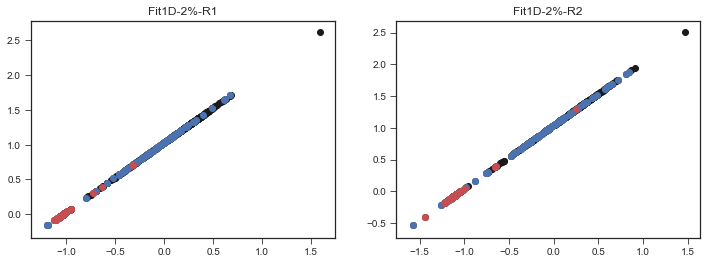

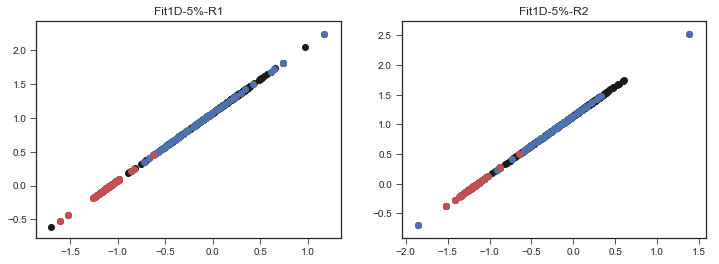

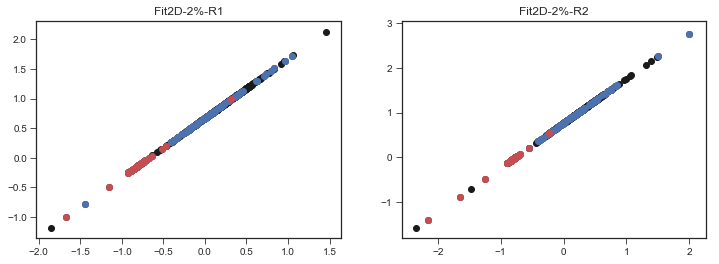

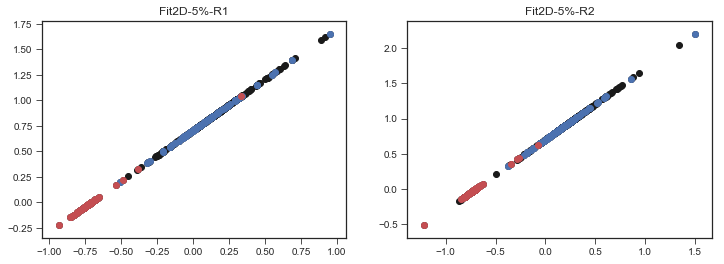

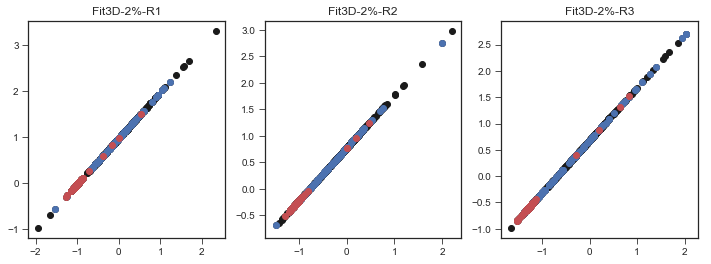

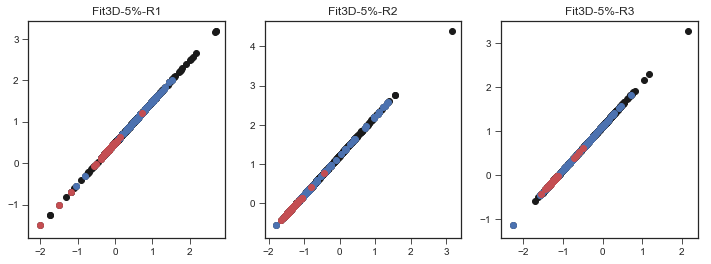

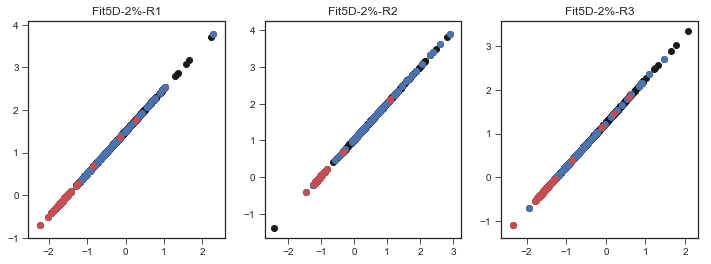

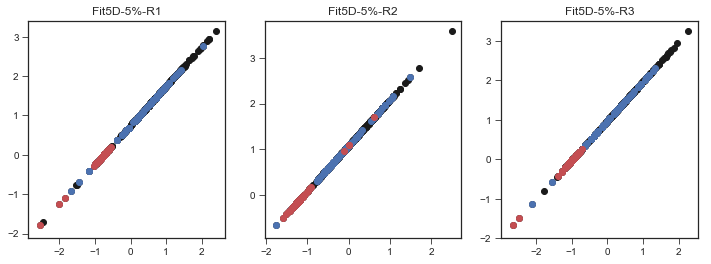

In [51]:
## Testing Li Mutatns fitness calculation...

li_mutants = merged_fitness[merged_fitness['source_publication']=='Li2019']
li_diploids = li_mutants[li_mutants['class']=='pure_diploids']
li_neutrals = li_mutants[li_mutants['class']=='neutral_haploids']

for condition in conditions:
    plt.figure(figsize=(12,4))
    for r,replicate in enumerate(replicates[condition]):
        plt.subplot(1,len(replicates[condition]),r+1)
        plt.title(f'{condition}-R{replicate}')
        plt.scatter(li_mutants[f'{condition}-R{replicate}_fitness'].values,
                    li_mutants[f'{condition}-R{replicate}_fitness_Li2019Neutrals'].values,color='k')
        plt.scatter(li_diploids[f'{condition}-R{replicate}_fitness'].values,li_diploids[f'{condition}-R{replicate}_fitness_Li2019Neutrals'].values,color='b',label='Neutrals')
        plt.scatter(li_neutrals[f'{condition}-R{replicate}_fitness'].values,li_neutrals[f'{condition}-R{replicate}_fitness_Li2019Neutrals'].values,color='r',label='Neutrals')





In [52]:
merged_fitness.to_csv('EvolvingFront_2%5%FitnessMeasurementData.csv',index=False)

In [25]:
time_fitness_df = p.DataFrame()

for condition in ['Fit1D-2%','Fit1D-5%','Fit2D-2%','Fit2D-5%']:
    for rep in replicates[condition]:
        for timepoint in range(timepoints[condition]-1):
#             print(condition,rep,timepoint)
            time_fitness_df[f'{condition}_R{rep}_T{timepoint}'] = time_fitnesses[f'{condition}-R{rep}_fitness'][:,timepoint]
            time_fitness_df[f'{condition}_R{rep}_T{timepoint}_error'] = time_fitnesses[f'{condition}-R{rep}_error'][:,timepoint]
            
time_fitness_df['barcode'] = fitness_df['barcode']

time_fitness_df = time_fitness_df.merge(merged_fitness,on='barcode')

time_fitness_df.to_csv('EvolvingFront_2%5%FitnessMeasurementData_fitnessByTime.csv',index=False)
# this_df[f'rep{rep_y}_T{timepoint}'] = time_fitnesses[f'{condition}-R{rep_y}_fitness'][:,timepoint]

In [18]:
time_fitness_df

,Fit1D_R1_T0,Fit1D_R1_T1,Fit1D_R1_T2,Fit1D_R1_T3,Fit1D_R2_T0,Fit1D_R2_T1,Fit1D_R2_T2,Fit1D_R2_T3,Fit1D_R3_T0,Fit1D_R3_T1,...,3D_Fitness_Li2019_Li2019Neutrals,5D_Fitness_Li2019_Li2019Neutrals,Fit1D_fitness_Li2019Neutrals,Fit1D_error_Li2019Neutrals,Fit2D_fitness_Li2019Neutrals,Fit2D_error_Li2019Neutrals,Fit3D_fitness_Li2019Neutrals,Fit3D_error_Li2019Neutrals,Fit5D_fitness_Li2019Neutrals,Fit5D_error_Li2019Neutrals
0,1.181580,0.992384,0.896342,0.907912,1.221568,0.793584,1.101757,0.871707,1.183919,0.940097,...,NaN,NaN,1.854213,0.013244,2.418044,0.019821,2.178929,0.039734,2.138530,0.061024
1,0.263214,0.879396,0.861078,0.951384,0.247982,0.855061,1.022419,0.914985,0.285107,1.071966,...,NaN,NaN,1.526006,0.013278,2.470954,0.019824,2.401595,0.039749,3.445532,0.061023
2,0.666903,0.894587,0.915977,0.792738,0.674205,0.880947,0.889975,0.864323,0.658365,0.902382,...,NaN,NaN,1.634421,0.013256,2.422144,0.019822,2.324177,0.039738,2.883461,0.061023
3,0.946461,1.062030,0.966730,0.747563,0.881091,0.969064,1.059834,0.884201,1.122402,1.060938,...,NaN,NaN,1.777634,0.013254,2.299449,0.019824,2.307957,0.039743,0.919034,0.061435
4,1.083442,1.086721,1.099697,0.752112,1.144229,0.980947,0.987048,0.972704,1.196408,0.997484,...,NaN,NaN,1.862081,0.013252,2.460616,0.019822,2.572099,0.039740,3.471515,0.061023
5,0.934662,1.009375,0.997281,0.912978,0.762258,1.081585,1.077248,1.074157,0.817916,1.174708,...,NaN,NaN,1.796000,0.013258,2.647208,0.019823,2.789865,0.039743,3.870808,0.061023
6,0.845925,0.941434,1.016440,0.761996,0.833416,0.973958,0.950619,0.941666,0.936249,0.997963,...,NaN,NaN,1.740959,0.013262,2.689097,0.019823,2.842987,0.039741,4.229223,0.061022
7,1.121401,1.373511,1.339241,1.022908,1.148062,1.200327,1.327096,1.205386,1.304200,1.235313,...,NaN,NaN,2.042799,0.013260,2.573157,0.019823,2.732125,0.039743,2.620266,0.061030
8,1.093160,1.011134,1.048694,0.716121,1.149978,0.912161,0.952861,0.916816,1.192337,0.968253,...,NaN,NaN,1.832449,0.013269,2.531985,0.019825,2.586727,0.039752,3.763478,0.061024
9,0.335999,0.976998,0.841382,0.864650,0.270703,0.809468,1.033797,0.767460,0.477366,1.022220,...,NaN,NaN,1.520127,0.013317,2.132630,0.019838,2.018416,0.039795,2.168812,0.061044


In [46]:
time_fitness_df.corr()['Fit1D_R2_T0'].loc[['Fit1D_R2_T1']].values[0]

0.5960207117363224

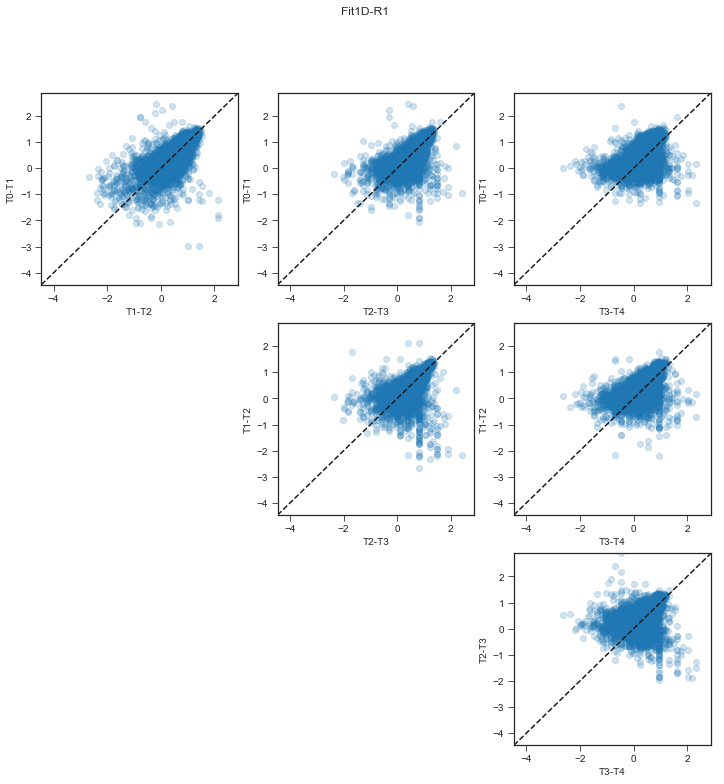

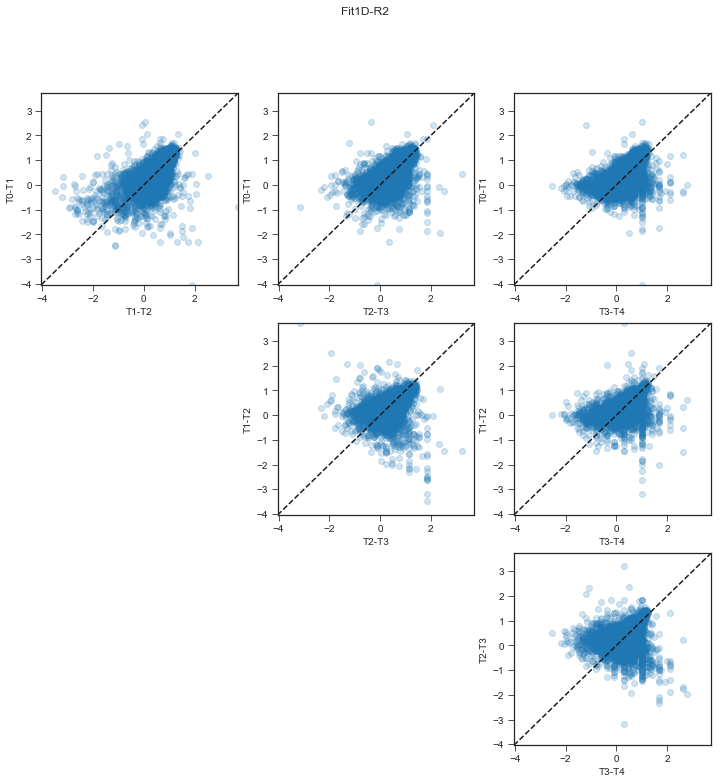

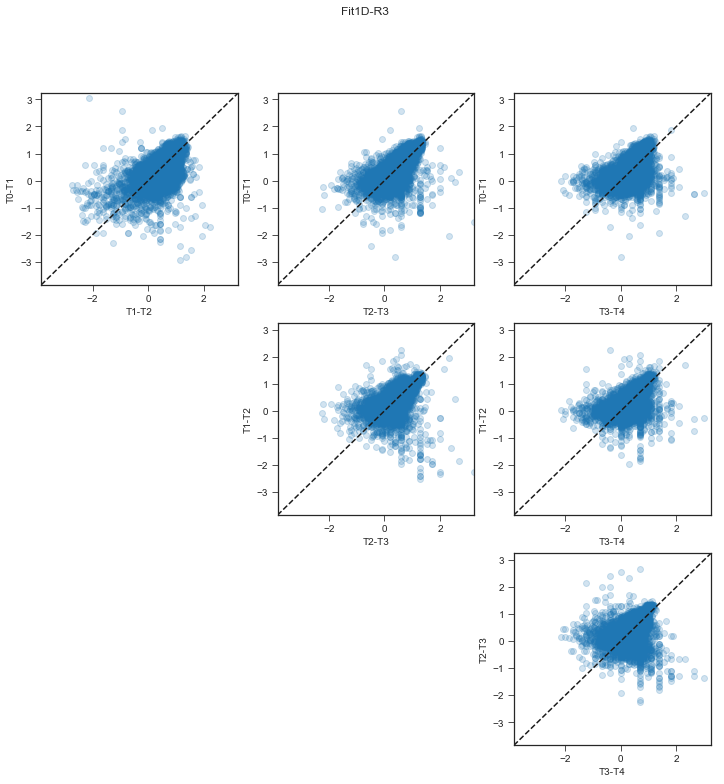

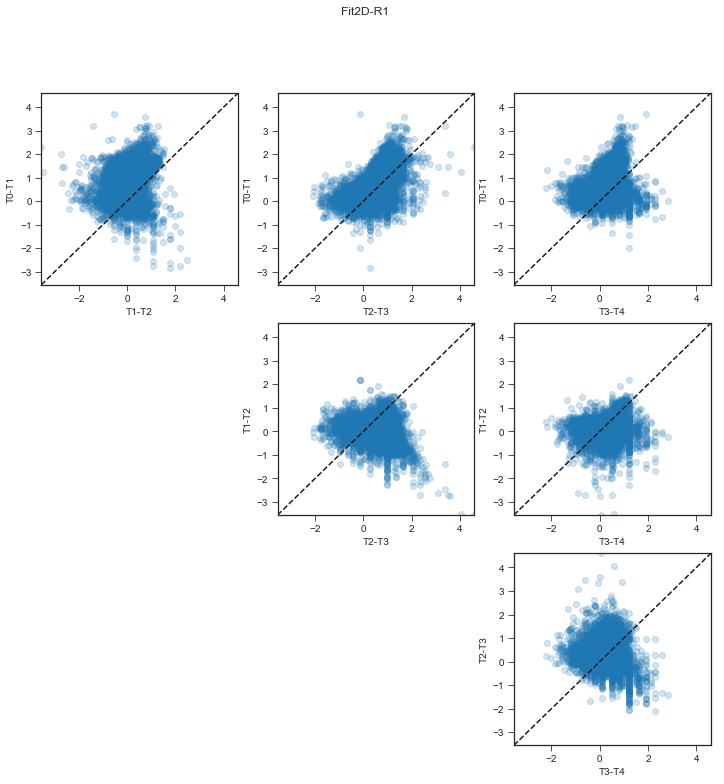

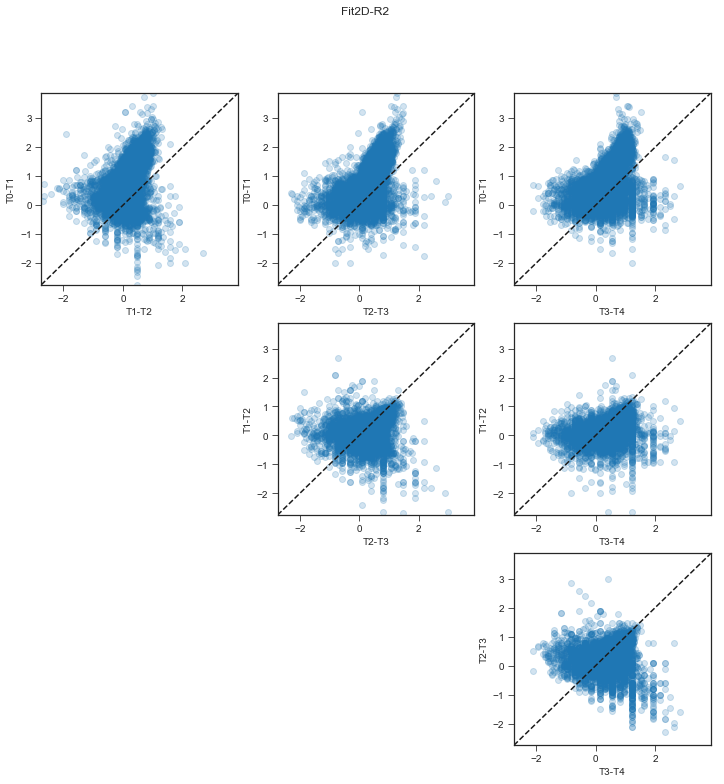

...

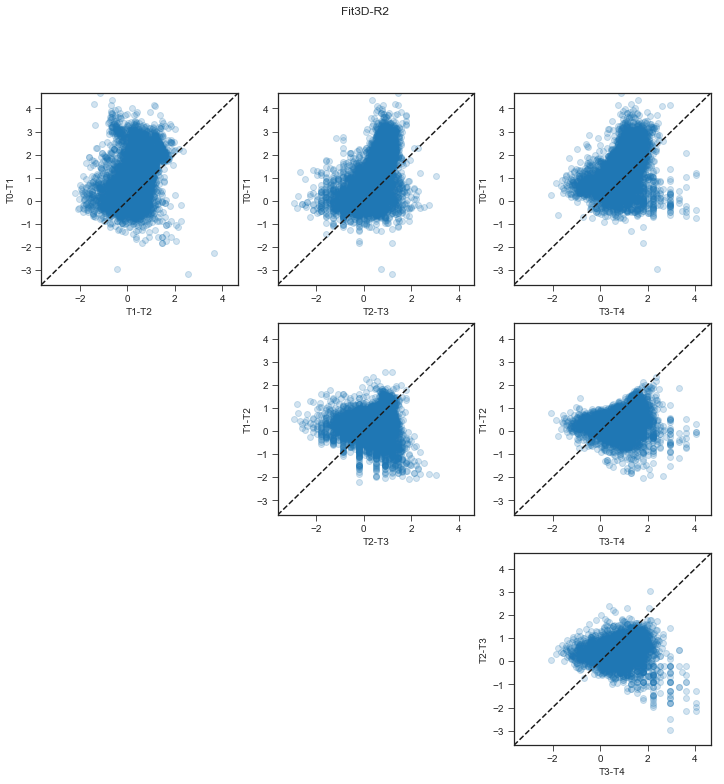

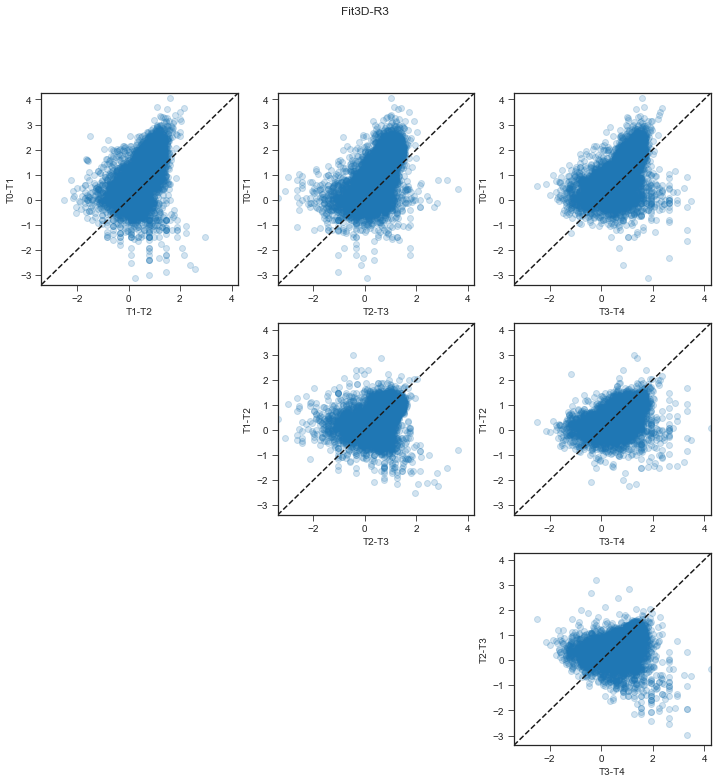

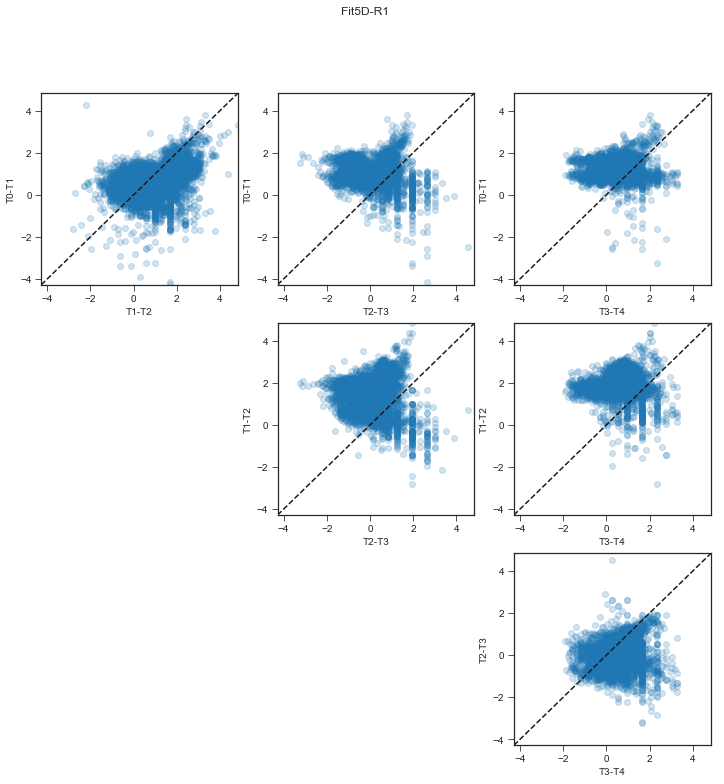

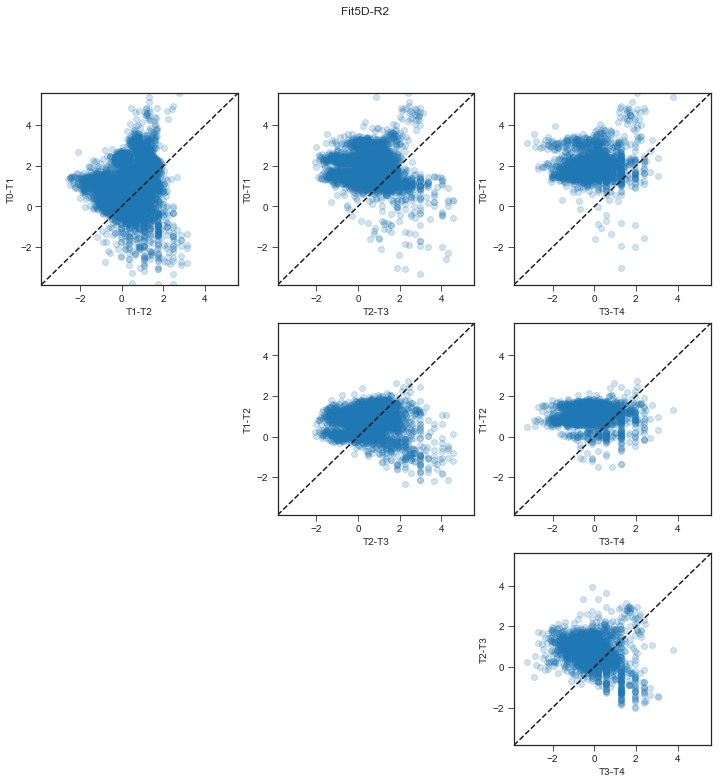

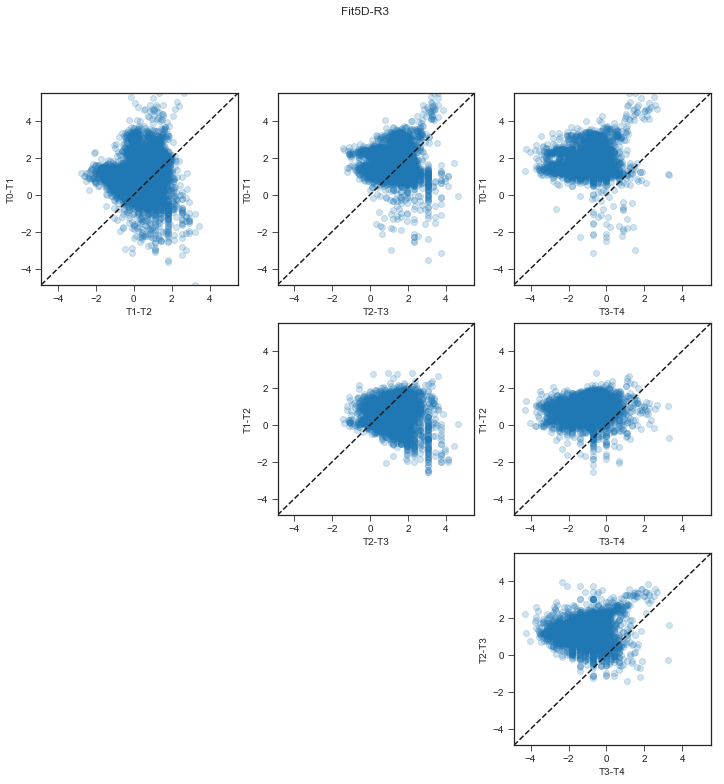

In [58]:
for condition in conditions:
    for rep in replicates[condition]:
        
        bigmin = np.nanmin(time_fitnesses[f'{condition}-R{rep}_fitness'])
        bigmax = np.nanmax(time_fitnesses[f'{condition}-R{rep}_fitness'])
        plt.figure(figsize=(4*3,4*3))
        plt.suptitle(f'{condition}-R{rep}')
#         counter = 0
        for x,y in combinations(range(4),2):
            plt.subplot(3,3,3*x+y)
#             counter += 1
            plt.scatter(time_fitnesses[f'{condition}-R{rep}_fitness'][:,y],
                        time_fitnesses[f'{condition}-R{rep}_fitness'][:,x],
                       alpha=0.2)
            plt.xlabel(f'T{y}-T{y+1}')
            plt.ylabel(f'T{x}-T{x+1}')
            
            plt.xlim(bigmin,bigmax)
            plt.ylim(bigmin,bigmax)
            
            plt.plot([bigmin,bigmax],[bigmin,bigmax],'k--')
        plt.savefig(f'{condition}-R{rep}_timepoint_fitness_comparison.pdf',bbox_inches='tight')

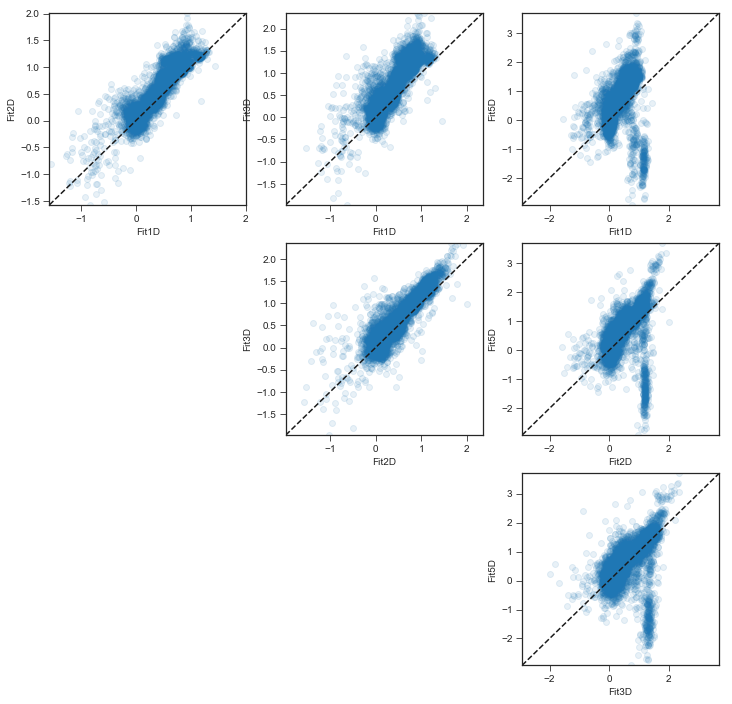

In [59]:
conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']

plt.figure(figsize=(4*3,4*3))
for condition1,condition2 in combinations(conditions,2):
    x = np.where(np.isin(conditions,condition1))[0][0]
    y = np.where(np.isin(conditions,condition2))[0][0]
    
    plt.subplot(3,3,3*x+y)
    plt.scatter(merged_fitness[f'{condition1}_fitness'],merged_fitness[f'{condition2}_fitness'],alpha=0.1)

    bigmin = np.nanmin([np.nanmin(merged_fitness[f'{condition1}_fitness']),np.nanmin(merged_fitness[f'{condition2}_fitness'])])
    bigmax = np.nanmax([np.nanmax(merged_fitness[f'{condition1}_fitness']),np.nanmax(merged_fitness[f'{condition2}_fitness'])])

    plt.xlim(bigmin,bigmax)
    plt.ylim(bigmin,bigmax)
            
    plt.plot([bigmin,bigmax],[bigmin,bigmax],'k--')
    
    plt.xlabel(condition1)
    plt.ylabel(condition2)

In [57]:
np.where(np.isin(conditions,condition1))[0][0]

0

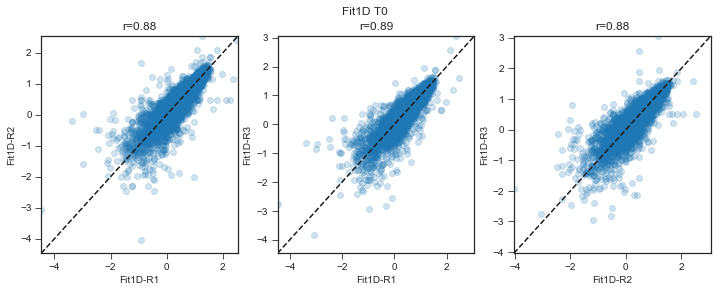

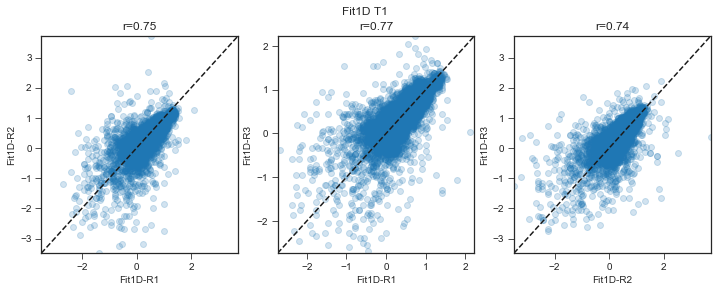

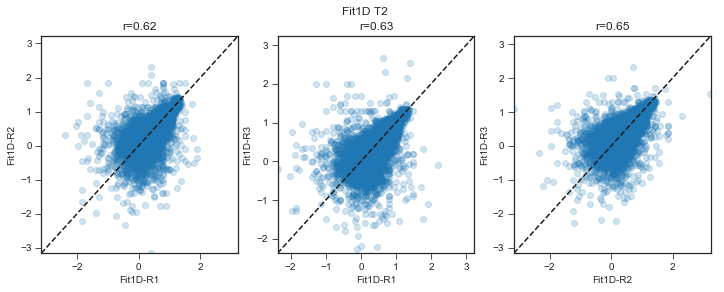

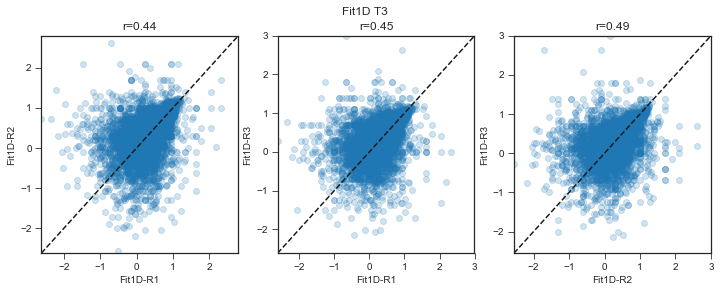

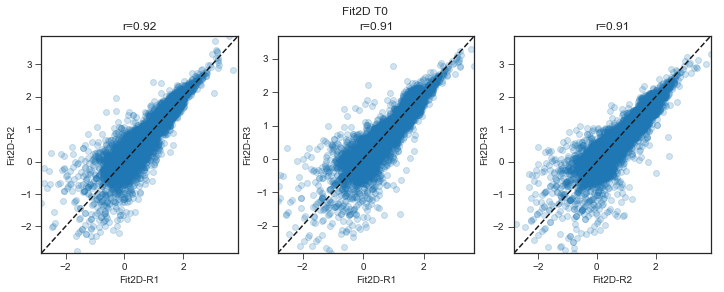

...

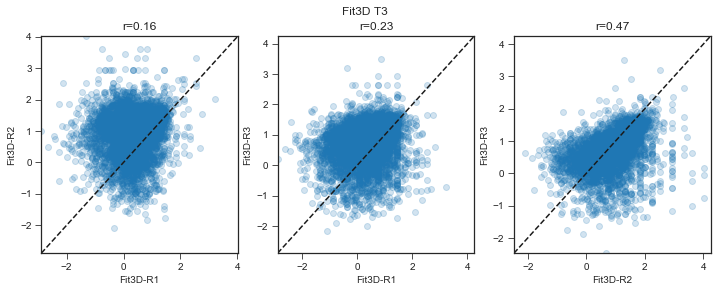

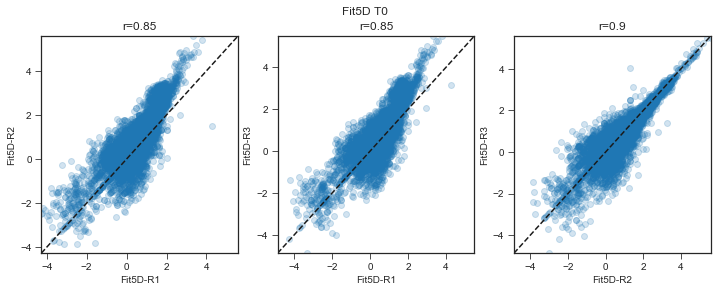

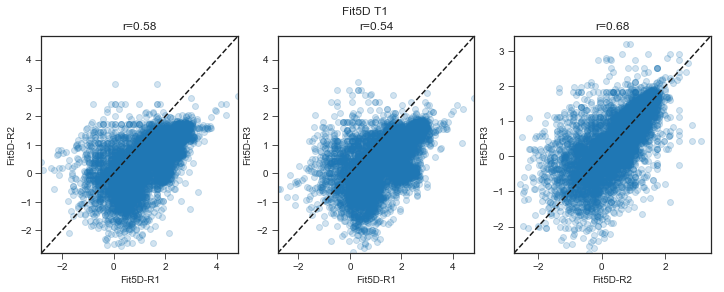

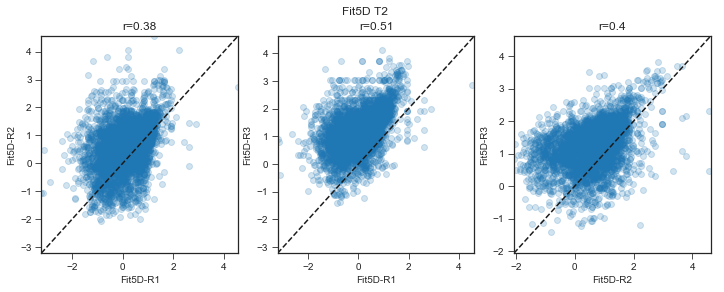

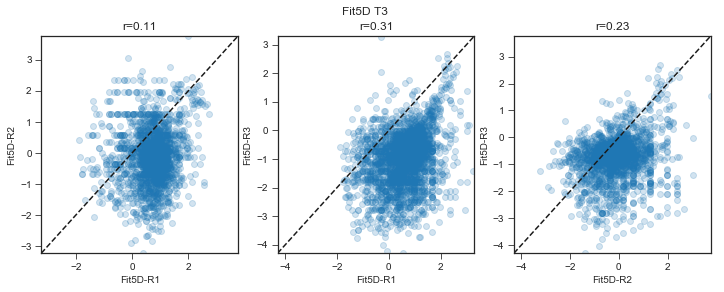

In [53]:
for condition in conditions:
    for timepoint in range(4):
        plt.figure(figsize=(4*3,4))
        plt.suptitle(f'{condition} T{timepoint}')
        for count,(rep_x,rep_y) in enumerate(combinations(replicates,2)):
        
            bigmin = np.nanmin([np.nanmin(time_fitnesses[f'{condition}-R{rep_x}_fitness'][:,timepoint]),
                               np.nanmin(time_fitnesses[f'{condition}-R{rep_y}_fitness'][:,timepoint])])
            bigmax = np.nanmax([np.nanmax(time_fitnesses[f'{condition}-R{rep_x}_fitness'][:,timepoint]),
                               np.nanmax(time_fitnesses[f'{condition}-R{rep_y}_fitness'][:,timepoint])])
            
#         counter = 0
#         for x,y in combinations(range(4),2):
            plt.subplot(1,3,count+1)
#             counter += 1
            plt.scatter(time_fitnesses[f'{condition}-R{rep_x}_fitness'][:,timepoint],
                        time_fitnesses[f'{condition}-R{rep_y}_fitness'][:,timepoint],
                       alpha=0.2)
            plt.xlabel(f'{condition}-R{rep_x}')
            plt.ylabel(f'{condition}-R{rep_y}')
            
            this_corr = time_fitness_df.corr()[f'{condition}_R{rep_x}_T{timepoint}'].loc[[f'{condition}_R{rep_y}_T{timepoint}']].values[0]
            
            plt.title(f'r = {this_corr:.2g}')
            
            plt.xlim(bigmin,bigmax)
            plt.ylim(bigmin,bigmax)
            
            plt.plot([bigmin,bigmax],[bigmin,bigmax],'k--')
        plt.savefig(f'{condition}_timepoint{timepoint}_replicate_fitness_comparison.pdf',bbox_inches='tight')

In [30]:
for condition in conditions:
    for timepoint in range(4):
        plt.figure(figsize=(4,4))
        plt.suptitle(f'{condition} T{timepoint}')
        for count,(rep_x,rep_y) in enumerate(combinations(replicates,2)):
        
        this_corr = time_fitness_df.corr()[f'{condition}_R{rep_x}_T{timepoint}'].loc[[f'{condition}_R{rep_y}_T{timepoint}']].values[0]
        
        
        

,rep2_T3,rep3_T3
rep2_T3,1.000000,0.230454
rep3_T3,0.230454,1.000000


In [168]:
len(fitness_df['barcode']),len(fitness_df_li2019neutrals['barcode'])

(9349, 9348)

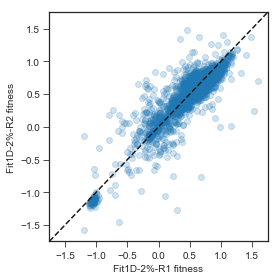

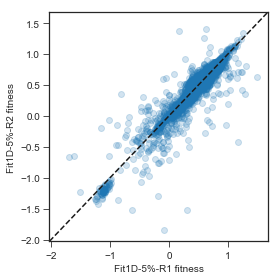

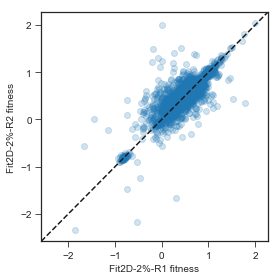

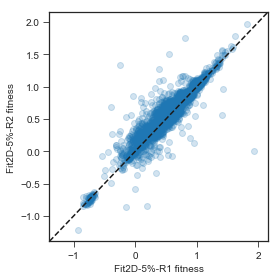

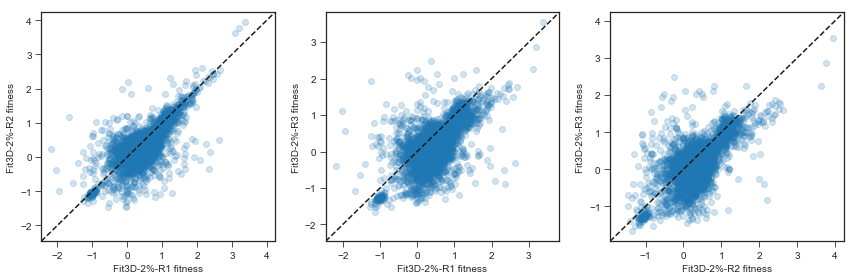

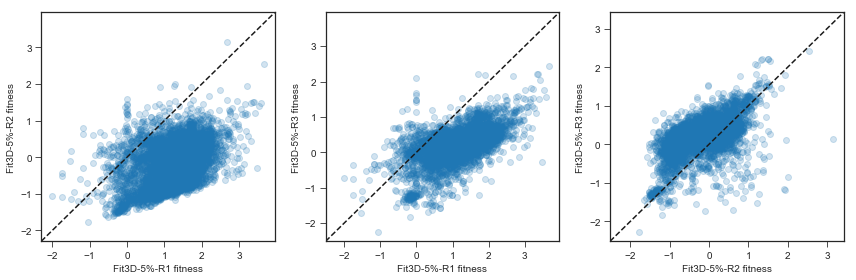

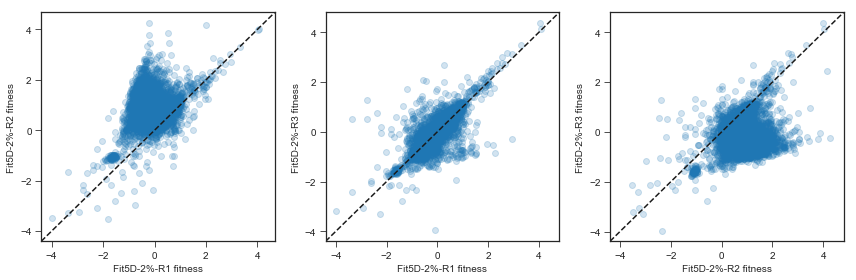

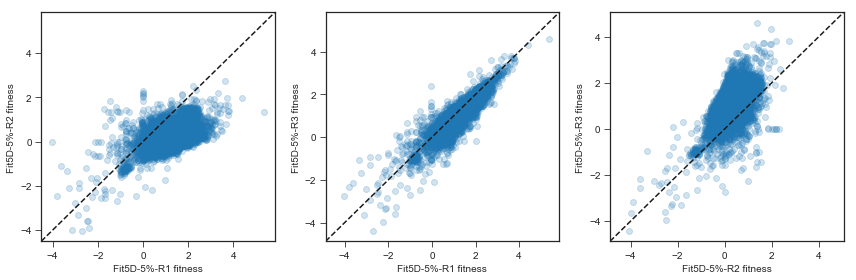

In [70]:
for condition in conditions:
    plt.figure(figsize=(4*scipy.special.comb(len(replicates[condition]),2),4))
    for i,(rep1,rep2) in enumerate(combinations(replicates[condition],2)):
        plt.subplot(1,scipy.special.comb(len(replicates[condition]),2),i+1)
        plt.scatter(fitness_df[f'{condition}-R{rep1}_fitness'].values,fitness_df[f'{condition}-R{rep2}_fitness'].values,alpha=0.2)
        plt.xlabel(f'{condition}-R{rep1} fitness')
        plt.ylabel(f'{condition}-R{rep2} fitness')
        
        xmin,xmax = plt.xlim()
        ymin,ymax = plt.ylim()
        new_min = np.min([xmin,ymin])
        new_max = np.max([xmax,ymax])

        plt.xlim(new_min,new_max)
        plt.ylim(new_min,new_max)
        plt.plot([new_min,new_max],[new_min,new_max],'k--')
        plt.tight_layout()
        
    plt.savefig(f'plots/{condition}_replicate_correlation.pdf',bbox_inches='tight')

In [171]:
onlyLi = fitness_df[fitness_df['source_publication']=='Li2019']
# onlyLi[f'{condition}_fitness'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values
condition = 'Fit1D'
linregress(onlyLi[f'{condition}_fitness'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values)

LinregressResult(slope=0.690979877631968, intercept=0.6587674695292984, rvalue=0.8860541999876511, pvalue=1.0321221896032314e-164, stderr=0.016381998302371623)

In [19]:
merged_fitness = fitness_df.merge(fitness_df_li2019neutrals,how='inner',on=[col for col in fitness_df.columns 
                                                                            if 'Fit' not in col])
x_cols = [col for col in merged_fitness.columns if '_x' in col]
y_cols = [col for col in merged_fitness.columns if '_y' in col]
merged_fitness = merged_fitness.rename(columns={col:col.replace('_x','') for col in x_cols})
merged_fitness = merged_fitness.rename(columns={col:col.replace('_y','_Li2019Neutrals') for col in y_cols})

EVO1D_IRA1_NON ['CCTACAAATACTAAGGCTATTCCTAT', 'TGTACAAATCTTAAGAAGATTACAAG', 'AATGCAATAATGAAATGATTTGAGGA', 'GAAATAAACCACAACGACATTCTAAT']
EVO2D_IRA1_NON ['CCAACAAAACACAAATCTGTTGTGTA']
EVO3D_IRA1_NON ['ATCACAATAACTAAACTGATTCTTCA']
IRA1_MIS
['CATAAAAAGACTAATCTTATTAATGC', 'TGATCAATCTACAAAAATATTTAATG', 'CATTGAATCACAAAATAGGTTAGATG', 'TATCGAAACCCAAAGAGATTTAATCG']


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


                                                barcode  gene  Fit1D_fitness  \
1226  CGCTAAAGACATAATGTGGTTTGTTG_CTTCCAACAAAAAATCATT...  IRA1       0.546667   

      Fit2D_fitness  Fit3D_fitness  Fit5D_fitness  FerPerHour_Li2019  \
1226       0.701166       0.870013       1.011818           0.035384   

      ResPerHour_Li2019  StaPerHour_Li2019  
1226           0.017962          -0.005845  
IRA1_NON
['CCTACAAATACTAAGGCTATTCCTAT', 'TGTACAAATCTTAAGAAGATTACAAG', 'AATGCAATAATGAAATGATTTGAGGA', 'GAAATAAACCACAACGACATTCTAAT', 'CCAACAAAACACAAATCTGTTGTGTA', 'ATCACAATAACTAAACTGATTCTTCA']
                                                barcode  gene  Fit1D_fitness  \
7539  CGCTAAAGACATAATGTGGTTTGTTG_AGAGTAATCTGCAAGATTC...  IRA1        0.75188   

      Fit2D_fitness  Fit3D_fitness  Fit5D_fitness  FerPerHour_Li2019  \
7539       0.875362       0.950748            0.0            0.05044   

      ResPerHour_Li2019  StaPerHour_Li2019  
7539            0.02798          -0.035156  
CYR1
['AGAACAAAAAC

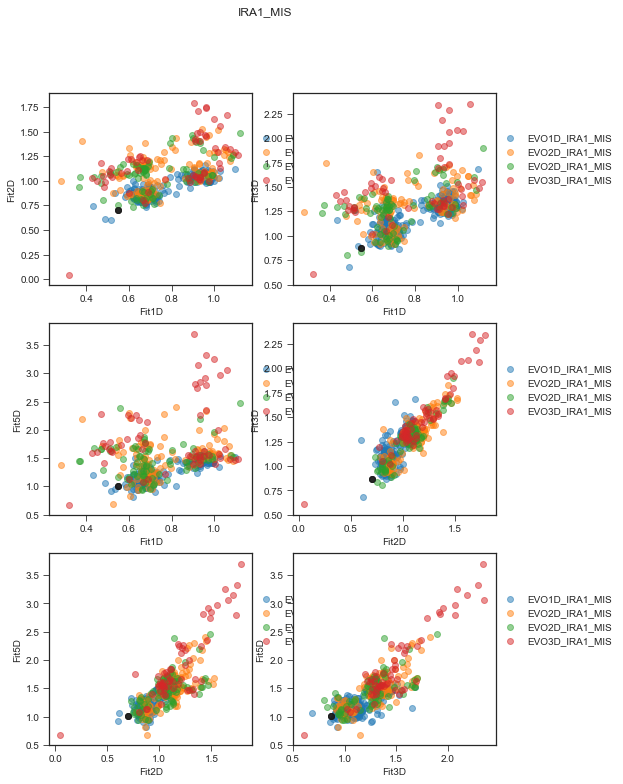

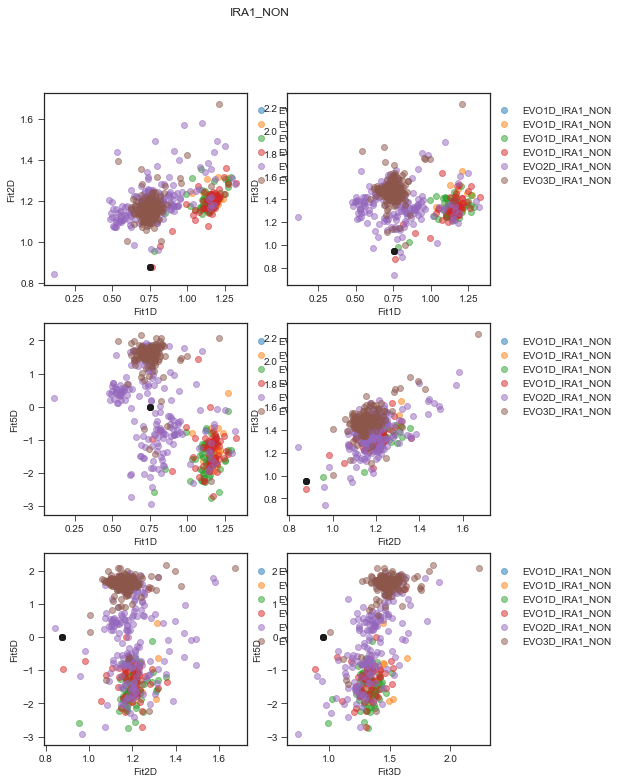

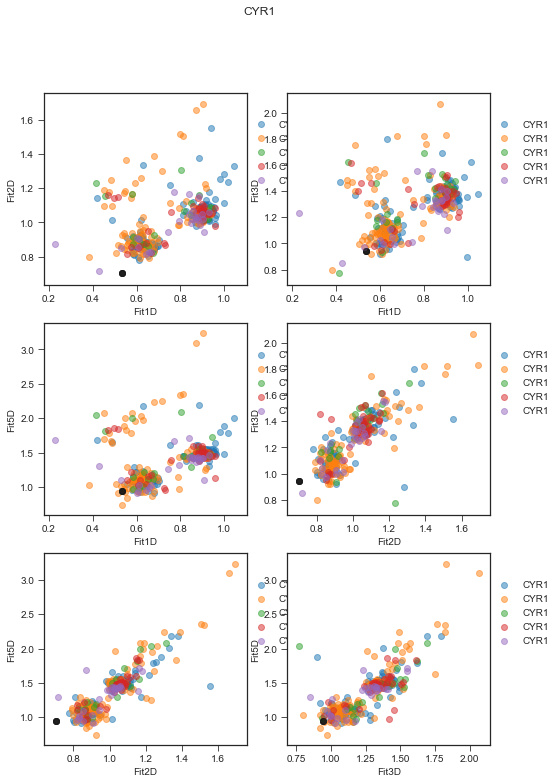

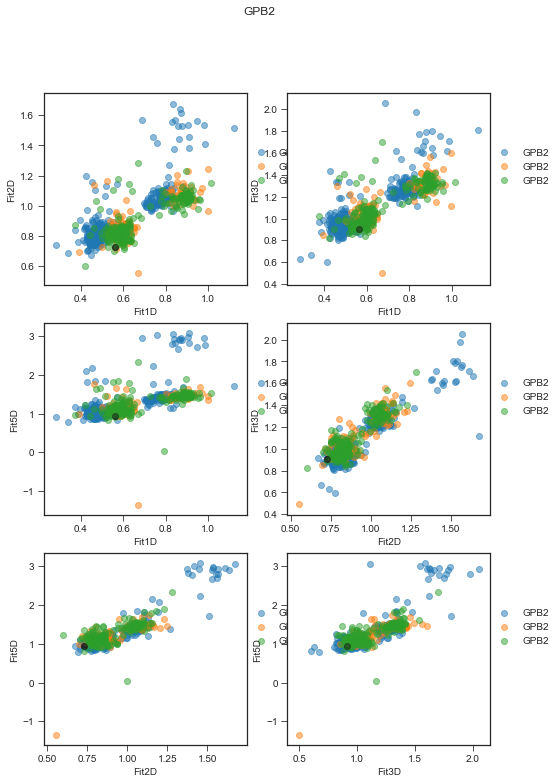

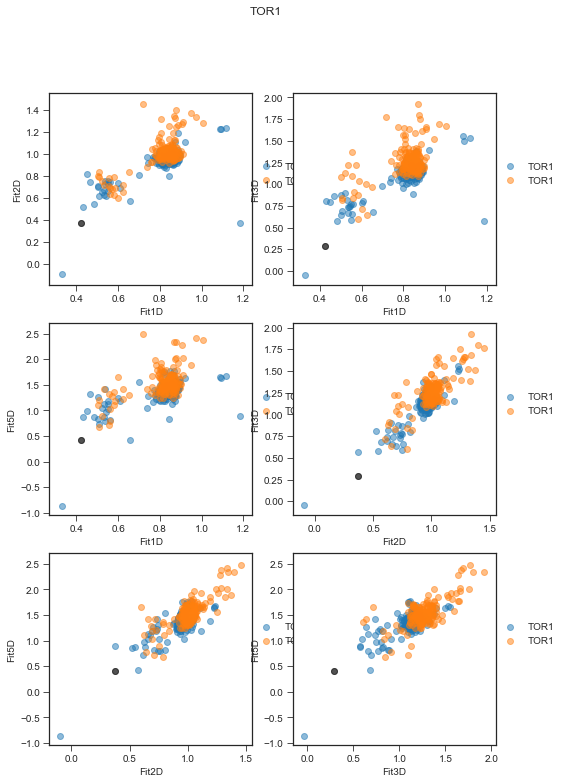

In [44]:
new_lowcomplexity_by_anc = {}
new_lowcomplexity_by_anc['IRA1_MIS'] = []
for key in ['EVO1D_IRA1_MIS','EVO2D_IRA1_MIS','EVO3D_IRA1_MIS']:
    for bc in new_lowcomplexity_dict[key]:
        new_lowcomplexity_by_anc['IRA1_MIS'].append(bc)
    
new_lowcomplexity_by_anc['IRA1_NON'] = []
for key in ['EVO1D_IRA1_NON','EVO2D_IRA1_NON','EVO3D_IRA1_NON']:
    print(key,new_lowcomplexity_dict[key])
    for bc in new_lowcomplexity_dict[key]:
        new_lowcomplexity_by_anc['IRA1_NON'].append(bc)
        
        
new_lowcomplexity_by_anc['CYR1'] = new_lowcomplexity_dict['CYR1']
new_lowcomplexity_by_anc['GPB2'] = new_lowcomplexity_dict['GPB2']
new_lowcomplexity_by_anc['TOR1'] = new_lowcomplexity_dict['TOR1']

#  = [bc for bc in ['EVO1D_IRA1_MIS','EVO2D_IRA1_MIS','EVO3D_IRA1_MIS']
# 'IRA1_NON' = ['EVO1D_IRA1_NON','EVO2D_IRA1_NON','EVO3D_IRA1_NON']

conditions = ['Fit1D','Fit2D','Fit3D','Fit5D']

for key,bcs in new_lowcomplexity_by_anc.items():
#     plt.gca().set_prop_cycle(None)
    plt.figure(figsize=(4*2,4*3))
    print(key)
    print(bcs)
    for bc in bcs:
        this_set = merged_fitness[merged_fitness['barcode_lowcomplexity'].isin([bc])]
        this_source = merged_fitness[merged_fitness['barcode']==rebarcoding_source_mutants[key]]
        
        if key in ['CYR1','GPB2','TOR1']:
            this_set = this_set[this_set['source_publication']=='This_study']
        
        for c,(cond1,cond2) in enumerate(combinations(conditions,2)):
            plt.subplot(3,2,c+1)
            plt.scatter(this_set[f'{cond1}_fitness'].values,this_set[f'{cond2}_fitness'].values,alpha=0.5,label=f'{new_lowcomplexity_bc_to_entry_dict[bc]}')
            plt.xlabel(cond1)
            plt.ylabel(cond2)
            plt.legend(loc=(1,0.5))
            plt.scatter(this_source[f'{cond1}_fitness'].values,this_source[f'{cond2}_fitness'].values,color='k',alpha=0.5)

    plt.suptitle(key)
    print(this_source[['barcode','gene','Fit1D_fitness','Fit2D_fitness','Fit3D_fitness','Fit5D_fitness','FerPerHour_Li2019','ResPerHour_Li2019','StaPerHour_Li2019']])
    
    

In [64]:
merged_fitness[merged_fitness['Fit5D_fitness']>2.5][['barcode','gene','source_publication','Fit1D_fitness','Fit2D_fitness','Fit3D_fitness','Fit5D_fitness']]

,barcode,gene,source_publication,Fit1D_fitness,Fit2D_fitness,Fit3D_fitness,Fit5D_fitness
1,CCGCCAATCCCGAACCCCGTTTCGCC_ACTCTAACGTGTAACTAAT...,NaN,Aggeli2020,0.693418,1.568898,1.901289,2.933739
4,TATCGAAACCCAAAGAGATTTAATCG_ATGACAAACTTTAAATAAT...,NaN,This_study,1.027318,1.558398,2.071675,2.969530
5,TATCGAAACCCAAAGAGATTTAATCG_CGATCAAAGACTAACTTAT...,NaN,This_study,0.961765,1.744947,2.289594,3.324642
6,TATCGAAACCCAAAGAGATTTAATCG_TTGCCAAGCTGGAAAGCTT...,NaN,This_study,0.906536,1.786823,2.342568,3.699445
8,TATCGAAACCCAAAGAGATTTAATCG_GTTTAAACCATTAATTATA...,NaN,This_study,0.997414,1.629827,2.086778,3.254056
13,TATCGAAACCCAAAGAGATTTAATCG_AACTAAATCGGGAACACTG...,NaN,This_study,0.960479,1.735549,2.066868,2.798507
18,GACAGAAAAGCCAAATGGATTTACCG_CGACAAATCCCGAAGAACT...,NaN,Aggeli2020,0.716677,1.651888,2.195901,3.022997
20,CCGCCAATCCCGAACCCCGTTTCGCC_GAGAAAAGTGACAAGAATT...,NaN,This_study,0.685980,1.568838,2.054083,2.935022
22,TATCGAAACCCAAAGAGATTTAATCG_TGCTGAATAGAAAAATGAG...,NaN,This_study,0.958359,1.467006,1.948823,2.920387
31,TATCGAAACCCAAAGAGATTTAATCG_GTAGTAATTTATAAGGGTT...,NaN,This_study,0.935281,1.492122,1.917144,2.849158


LinregressResult(slope=0.9543927184816873, intercept=0.8690833387297143, rvalue=0.994690457158958, pvalue=0.0, stderr=0.0009893592428035032)
LinregressResult(slope=0.8596937089715873, intercept=0.9696664012463003, rvalue=0.9262293831074159, pvalue=0.0, stderr=0.0035056570977735637)
LinregressResult(slope=0.7417528219796347, intercept=0.7230483783858679, rvalue=0.9515994136175778, pvalue=0.0, stderr=0.0024003480702093944)
LinregressResult(slope=0.9570792356070171, intercept=0.5182357446073395, rvalue=0.985453399942016, pvalue=0.0, stderr=0.0016537540860474004)


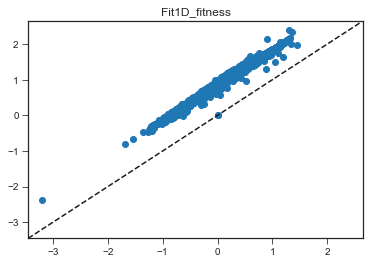

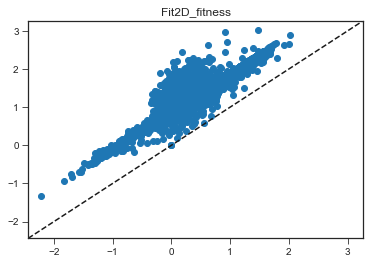

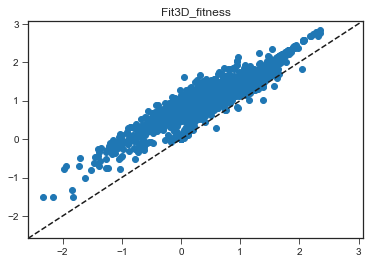

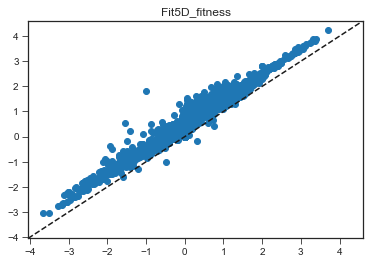

In [90]:
conditions = ['Fit1D_fitness','Fit2D_fitness','Fit3D_fitness','Fit5D_fitness']

for condition in conditions:
    plt.figure()
    plt.title(condition)
    plt.scatter(nonan_merged[condition+'_x'].values,nonan_merged[condition+'_y'].values)
    
    
    print(linregress(nonan_merged[condition+'_x'].values,nonan_merged[condition+'_y'].values))
    xmin,xmax = plt.xlim()
    ymin,ymax = plt.ylim()
    new_min = np.min([xmin,ymin])
    new_max = np.max([xmax,ymax])

    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')

In [213]:
merged_fitness

,Fit1D-R1_error,Fit1D-R1_fitness,Fit1D-R2_error,Fit1D-R2_fitness,Fit1D-R3_error,Fit1D-R3_fitness,Fit2D-R1_error,Fit2D-R1_fitness,Fit2D-R2_error,Fit2D-R2_fitness,...,Fit5D_error_Li2019Neutrals,ResPerHour,FerPerHour,StaPerHour,ResPerHour_Li2019Neutrals,FerPerHour_Li2019Neutrals,StaPerHour_Li2019Neutrals,ResPerHour_properNeutral,FerPerHour_properNeutral,StaPerHour_properNeutral
0,0.039749,1.014569,0.039753,1.026117,0.039752,1.017752,0.059465,1.514985,0.059464,1.553292,...,0.061024,0.020680,0.058548,-0.002002,0.023493,0.110015,-0.000842,0.020680,0.058548,-0.002002
1,0.039953,0.684407,0.039985,0.695791,0.039966,0.700061,0.059494,1.561770,0.059494,1.542261,...,0.061023,0.036478,0.034219,0.021509,0.039373,0.085532,0.021749,0.036478,0.034219,0.021509
2,0.039820,0.788187,0.039833,0.805517,0.039830,0.806607,0.059472,1.506712,0.059472,1.556553,...,0.061023,0.029993,0.042508,0.010776,0.032822,0.093946,0.011652,0.029993,0.042508,0.010776
3,0.039812,0.907575,0.039831,0.929910,0.039804,0.991588,0.059489,1.294069,0.059487,1.397092,...,0.061435,0.018924,0.054208,-0.027874,0.021742,0.105667,-0.028936,0.018924,0.054208,-0.027874
4,0.039798,0.986055,0.039806,1.036586,0.039798,1.059314,0.059476,1.514415,0.059476,1.574225,...,0.061023,0.022128,0.058675,0.018705,0.024939,0.110145,0.018738,0.022128,0.058675,0.018705
5,0.039824,0.951604,0.039855,0.967447,0.039845,0.966251,0.059475,1.711583,0.059474,1.783003,...,0.061023,0.032633,0.051952,0.021563,0.035467,0.103383,0.022520,0.032633,0.051952,0.021563
6,0.039861,0.867812,0.039880,0.910764,0.039859,0.941033,0.059474,1.757831,0.059479,1.738757,...,0.061022,0.036679,0.047489,0.028268,0.039506,0.098934,0.028880,0.036679,0.047489,0.028268
7,0.039854,1.172167,0.039873,1.208094,0.039847,1.244815,0.059477,1.600838,0.059477,1.685712,...,0.061030,0.019272,0.070704,-0.003152,0.022098,0.122150,-0.002330,0.019272,0.070704,-0.003152
8,0.039909,0.956645,0.039929,1.003871,0.039911,1.031732,0.059497,1.586250,0.059498,1.617138,...,0.061024,0.026351,0.055751,0.024318,0.029147,0.107241,0.024516,0.026351,0.055751,0.024318
9,0.040189,0.696916,0.040304,0.656784,0.040178,0.712597,0.059612,1.215108,0.059609,1.215747,...,0.061044,0.022587,0.037403,0.001936,0.025521,0.088628,0.003133,0.022587,0.037403,0.001936


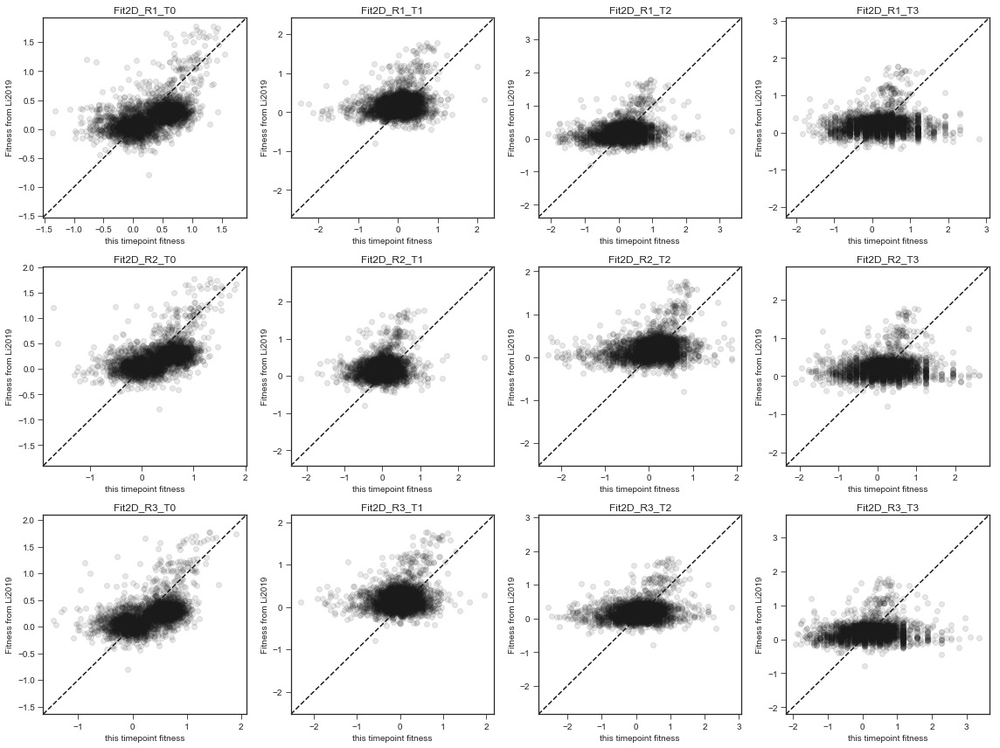

In [28]:
onlyVen = time_fitness_df[time_fitness_df['source_publication']=='Venkataram2015']

condition = 'Fit2D'

plt.figure(figsize=(16,12))

for rep in replicates:
    for timepoint in range(4):
        plt.subplot(3,4,(rep-1)*4+timepoint+1)
        
        this_entry = f'{condition}_R{rep}_T{timepoint}'
        
        plt.title(this_entry)

        plt.scatter(onlyVen[this_entry].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')

        xmin,xmax = plt.xlim()
        ymin,ymax = plt.ylim()
        new_min = np.min([xmin,ymin])
        new_max = np.max([xmax,ymax])

        plt.xlim(new_min,new_max)
        plt.ylim(new_min,new_max)
        plt.plot([new_min,new_max],[new_min,new_max],'k--')
        
        plt.xlabel('this timepoint fitness')
        plt.ylabel('Fitness from Li2019')
plt.tight_layout()
        
plt.savefig(f'{condition}_timepoint_x_timepoint_vs_li2019.pdf',bbox_inches='tight')

In [ ]:
colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in merged_fitness['source_publication']]

for condition in conditions:
    plt.figure(figsize=(12,4))
    
    for 
    plt.subplot(1,4,1)
    
    onlyVen = time_fitness_df[time_fitness_df['source_publication']=='Venkataram2015']
    plt.scatter(onlyVen[f'{condition}_fitness'].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')
    
#     onlyLi = merged_fitness[merged_fitness['source_publication']=='Li2019']
#     plt.scatter(onlyLi[f'{condition}_fitness_Li2019Neutrals'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='r')


    
    plt.title('All previous data, using proper neutral')
#     plt.scatter(merged_fitness[f'{condition}_fitness'].values,merged_fitness[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color=colors)
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    
    xmin,xmax = plt.xlim()
    ymin,ymax = plt.ylim()
    new_min = np.min([xmin,ymin])
    new_max = np.max([xmax,ymax])
    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.text(s='From Li et al 2019',color='r',x=0.5,y=0.1,transform=plt.gca().transAxes)
    plt.text(s='From Venkataram et al 2015',color='k',x=0.5,y=0.05,transform=plt.gca().transAxes)
    
#     if condition == 'Fit1D':
#         plt.plot([new_min,new_max],[new_min+0.3,new_max+0.3],'r')
        
    plt.subplot(1,3,2)
    plt.title('Li2019 mutants')
    onlyLi = merged_fitness[merged_fitness['source_publication']=='Li2019']
    plt.scatter(onlyLi[f'{condition}_fitness_Li2019Neutrals'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='r')
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    

    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.subplot(1,3,3)
    plt.title('Venkataram mutants')
    onlyVen = merged_fitness[merged_fitness['source_publication']=='Venkataram2015']
    plt.scatter(onlyVen[f'{condition}_fitness'].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.tight_layout()
    plt.savefig(f'best {condition} now vs Li2019 comparision.pdf',bbox_inches='tight')
    

    
#     plt.axis('equal')

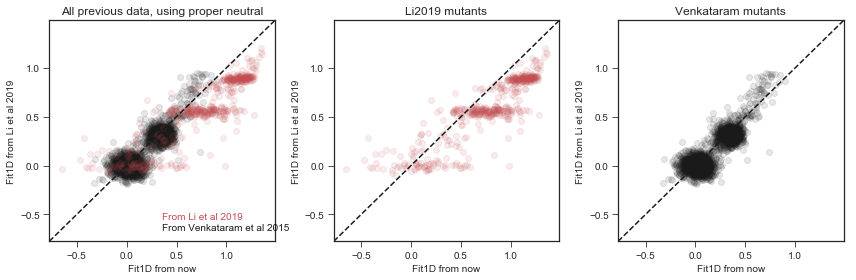

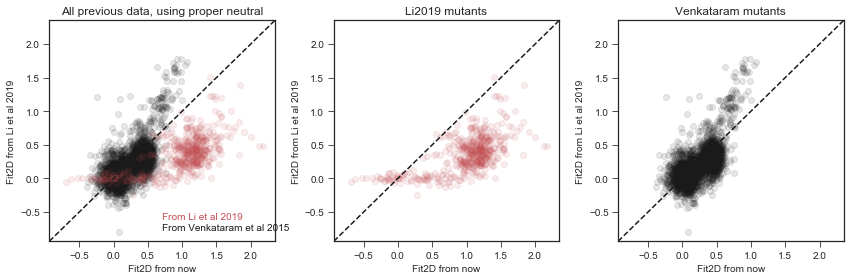

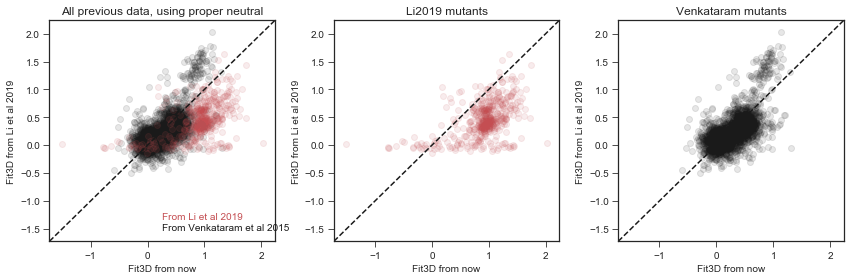

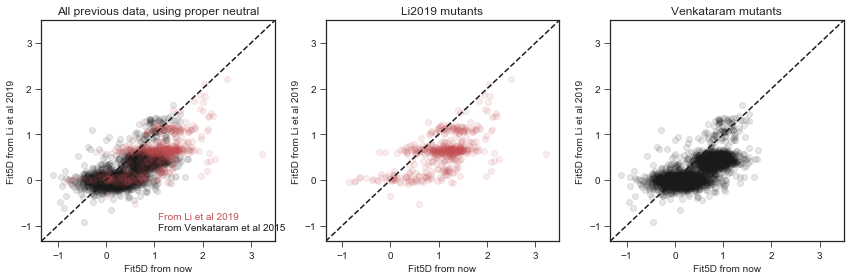

In [15]:
colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in merged_fitness['source_publication']]

for condition in conditions:
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    
    onlyVen = merged_fitness[merged_fitness['source_publication']=='Venkataram2015']
    plt.scatter(onlyVen[f'{condition}_fitness'].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')
    
    onlyLi = merged_fitness[merged_fitness['source_publication']=='Li2019']
    plt.scatter(onlyLi[f'{condition}_fitness_Li2019Neutrals'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='r')


    
    plt.title('All previous data, using proper neutral')
#     plt.scatter(merged_fitness[f'{condition}_fitness'].values,merged_fitness[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color=colors)
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    
    xmin,xmax = plt.xlim()
    ymin,ymax = plt.ylim()
    new_min = np.min([xmin,ymin])
    new_max = np.max([xmax,ymax])
    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.text(s='From Li et al 2019',color='r',x=0.5,y=0.1,transform=plt.gca().transAxes)
    plt.text(s='From Venkataram et al 2015',color='k',x=0.5,y=0.05,transform=plt.gca().transAxes)
    
#     if condition == 'Fit1D':
#         plt.plot([new_min,new_max],[new_min+0.3,new_max+0.3],'r')
        
    plt.subplot(1,3,2)
    plt.title('Li2019 mutants')
    onlyLi = merged_fitness[merged_fitness['source_publication']=='Li2019']
    plt.scatter(onlyLi[f'{condition}_fitness_Li2019Neutrals'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='r')
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    

    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.subplot(1,3,3)
    plt.title('Venkataram mutants')
    onlyVen = merged_fitness[merged_fitness['source_publication']=='Venkataram2015']
    plt.scatter(onlyVen[f'{condition}_fitness'].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.tight_layout()
    plt.savefig(f'best {condition} now vs Li2019 comparision.pdf',bbox_inches='tight')
    

    
#     plt.axis('equal')

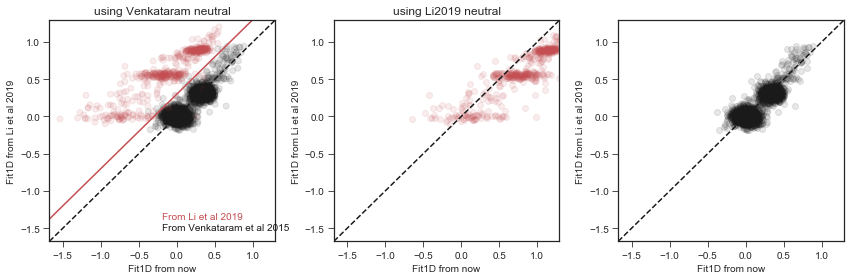

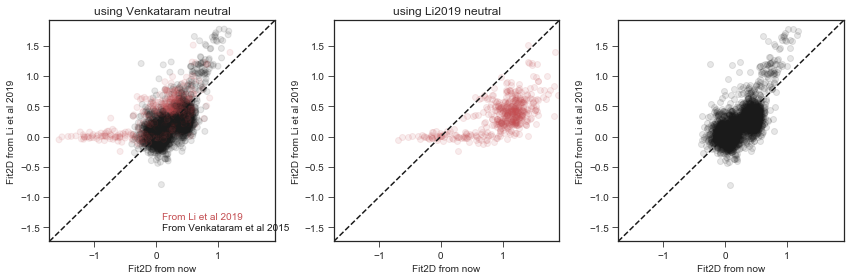

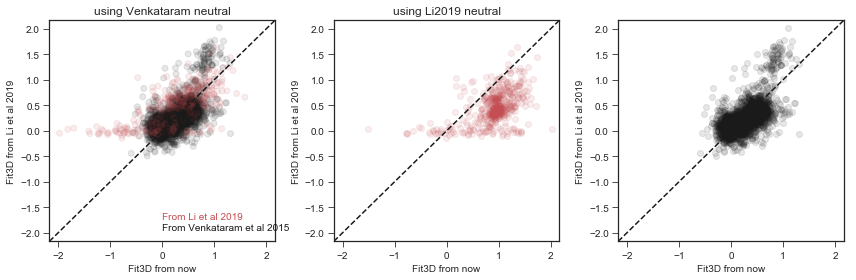

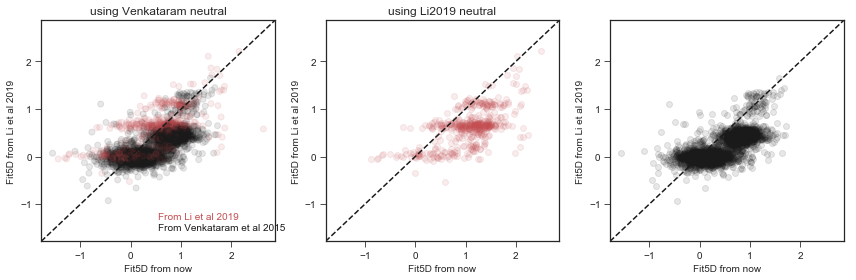

In [60]:
colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in merged_fitness['source_publication']]

for condition in conditions:
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
#     onlyVen = merged_fitness[merged_fitness['source_publication']=='Venkataram2015']
#     plt.scatter(onlyVen[f'{condition}_fitness'].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')
    plt.title('using Venkataram neutrals correct')
    plt.scatter(merged_fitness[f'{condition}_fitness'].values,merged_fitness[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color=colors)
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    
    xmin,xmax = plt.xlim()
    ymin,ymax = plt.ylim()
    new_min = np.min([xmin,ymin])
    new_max = np.max([xmax,ymax])
    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.text(s='From Li et al 2019',color='r',x=0.5,y=0.1,transform=plt.gca().transAxes)
    plt.text(s='From Venkataram et al 2015',color='k',x=0.5,y=0.05,transform=plt.gca().transAxes)
    
    if condition == 'Fit1D':
        plt.plot([new_min,new_max],[new_min+0.3,new_max+0.3],'r')
        
    plt.subplot(1,3,2)
    plt.title('using Li2019 neutral')
    onlyLi = merged_fitness[merged_fitness['source_publication']=='Li2019']
    plt.scatter(onlyLi[f'{condition}_fitness_Li2019Neutrals'].values,onlyLi[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='r')
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    

    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.subplot(1,3,3)
    onlyVen = merged_fitness[merged_fitness['source_publication']=='Venkataram2015']
    plt.scatter(onlyVen[f'{condition}_fitness'].values,onlyVen[f'{condition.replace("Fit","")}_Fitness_Li2019'].values,alpha=0.1,color='k')
    plt.xlabel(f'{condition} from now')
    plt.ylabel(f'{condition} from Li et al 2019')
    
    plt.xlim(new_min,new_max)
    plt.ylim(new_min,new_max)
    plt.plot([new_min,new_max],[new_min,new_max],'k--')
    
    plt.tight_layout()
#     plt.savefig(f'bestlist {condition} now vs Li2019 comparision.pdf',bbox_inches='tight')
    

    
#     plt.axis('equal')

In [50]:
weird_1d_offset = fitness_df[(fitness_df[f'1D_Fitness_Li2019']>fitness_df[f'Fit1D_fitness']+0.3)]


np.unique(weird_1d_offset['source_publication'],return_counts=True)



(array(['Li2019', 'Venkataram2015'], dtype=object), array([644,  10]))

In [55]:
np.unique(fitness_df[(fitness_df[f'Fit1D_fitness']<0.1) & (fitness_df[f'1D_Fitness_Li2019']>0.5)]['source_publication'].values)

array(['Li2019'], dtype=object)

In [111]:
nonan_merged['source_publication_x']

0        This_study
1        Aggeli2020
2        This_study
3        This_study
4        This_study
5        This_study
6        This_study
7        This_study
8        This_study
9        This_study
10       This_study
11       This_study
12       This_study
13       This_study
14       This_study
15       Aggeli2020
16       This_study
17       This_study
18       Aggeli2020
19       This_study
20       This_study
21       This_study
22       This_study
23       Aggeli2020
24       This_study
25       This_study
26       This_study
27       This_study
28       This_study
29       Aggeli2020
            ...    
10147    Aggeli2020
10148    Aggeli2020
10149    Aggeli2020
10150    Aggeli2020
10151    Aggeli2020
10152    Aggeli2020
10154    Aggeli2020
10155    Aggeli2020
10156    Aggeli2020
10157    Aggeli2020
10158    Aggeli2020
10159    Aggeli2020
10161    Aggeli2020
10162    Aggeli2020
10163    Aggeli2020
10164    Aggeli2020
10165    Aggeli2020
10166    Aggeli2020
10167    Aggeli2020


In [33]:

# fitness_df['ResPerHour'] = (fitness_df['Fit2D_fitness'].values-fitness_df['Fit1D_fitness'].values)/24
# fitness_df['FerPerHour'] = (fitness_df['Fit1D_fitness'].values-4*fitness_df['ResPerHour'])/16
# fitness_df['StaPerHour'] = (fitness_df['Fit5D_fitness'].values-fitness_df['Fit3D_fitness'].values)/48

# fitness_df['ResPerHour_LiNeutrals'] = (fitness_df['Fit2D_fitness'].values-fitness_df['Fit1D_fitness'].values)/24
# fitness_df['FerPerHour_LiNeutrals'] = (fitness_df['Fit1D_fitness'].values-4*fitness_df['ResPerHour'])/16
# fitness_df['StaPerHour_LiNeutrals'] = (fitness_df['Fit5D_fitness'].values-fitness_df['Fit3D_fitness'].values)/48

merged_fitness['ResPerHour'] = (merged_fitness['Fit2D_fitness'].values-merged_fitness['Fit1D_fitness'].values)/24
merged_fitness['FerPerHour'] = (merged_fitness['Fit1D_fitness'].values-4*merged_fitness['ResPerHour'])/16
merged_fitness['StaPerHour'] = (merged_fitness['Fit5D_fitness'].values-merged_fitness['Fit3D_fitness'].values)/48

merged_fitness['ResPerHour_Li2019Neutrals'] = (merged_fitness['Fit2D_fitness_Li2019Neutrals'].values-merged_fitness['Fit1D_fitness_Li2019Neutrals'].values)/24
merged_fitness['FerPerHour_Li2019Neutrals'] = (merged_fitness['Fit1D_fitness_Li2019Neutrals'].values-4*merged_fitness['ResPerHour_Li2019Neutrals'])/16
merged_fitness['StaPerHour_Li2019Neutrals'] = (merged_fitness['Fit5D_fitness_Li2019Neutrals'].values-merged_fitness['Fit3D_fitness_Li2019Neutrals'].values)/48


merged_fitness['ResPerHour_properNeutral'] = [merged_fitness['ResPerHour'].values[count] if pub != 'Li2019' else merged_fitness['ResPerHour_Li2019Neutrals'].values[count] for count,pub in enumerate(merged_fitness['source_publication'])]
merged_fitness['FerPerHour_properNeutral'] = [merged_fitness['FerPerHour'].values[count] if pub != 'Li2019' else merged_fitness['FerPerHour_Li2019Neutrals'].values[count] for count,pub in enumerate(merged_fitness['source_publication'])]
merged_fitness['StaPerHour_properNeutral'] = [merged_fitness['StaPerHour'].values[count] if pub != 'Li2019' else merged_fitness['StaPerHour_Li2019Neutrals'].values[count] for count,pub in enumerate(merged_fitness['source_publication'])]

# fitness_df['ResPerHour_LiNeutrals'] = (fitness_df['Fit2D_fitness_y'].values-fitness_df['Fit1D_fitness_y'].values)/24
# fitness_df['FerPerHour_LiNeutrals'] = (fitness_df['Fit1D_fitness_y'].values-4*fitness_df['ResPerHour_LiNeutral'])/16
# fitness_df['StaPerHour_LiNeutrals'] = (nonan_merged['Fit5D_fitness_y'].values-fitness_df['Fit3D_fitness_y'].values)/48



# fitness_df

In [22]:
for entry in this_set:
    print(entry)

Fit1D-R1_error
Fit1D-R1_fitness
Fit1D-R2_error
Fit1D-R2_fitness
Fit1D-R3_error
Fit1D-R3_fitness
Fit2D-R1_error
Fit2D-R1_fitness
Fit2D-R2_error
Fit2D-R2_fitness
Fit2D-R3_error
Fit2D-R3_fitness
Fit3D-R1_error
Fit3D-R1_fitness
Fit3D-R2_error
Fit3D-R2_fitness
Fit3D-R3_error
Fit3D-R3_fitness
Fit5D-R1_error
Fit5D-R1_fitness
Fit5D-R2_error
Fit5D-R2_fitness
Fit5D-R3_error
Fit5D-R3_fitness
BCID
Fit2D-R2-T3
Fit1D-R1-T2
Fit1D-R2-T1
Fit3D-R1-T2
Fit2D-R1-T1_PCRb
Fit1D-T0
Fit5D-R3-T1
Fit3D-R2-T1_PCRb
Fit2D-R1-T4
Fit1D-R2-T3
Fit3D-R1-T1_PCRb
Fit2D-R2-T4_PCRb
Fit1D-R2-T1_PCRb
Fit1D-R1-T1
Fit3D-R3-T3_PCRb
Fit1D-R2-T2_PCRb
Fit3D-T0_PCRb
Fit2D-R2-T1
Fit5D-R1-T3
Fit2D-R3-T2_PCRb
Fit3D-R3-T2
Fit5D-R2-T1
Fit2D-R1-T4_PCRb
Fit3D-R3-T2_PCRb
Fit2D-R2-T4
Fit1D-R2-T2
Fit5D-R3-T4_PCRb
Fit5D-R3-T4
Fit1D-R1-T2_PCRb
Fit2D-R1-T1
Fit1D-R1-T3_PCRb
Fit1D-R1-T3
Fit1D-R2-T2_PCRc
Fit2D-R3-T2
Fit3D-R2-T1
Fit5D-T0
Fit1D-T0_PCRb
Fit3D-R2-T2_PCRb
Fit3D-R2-T3_PCRb
Fit2D-R3-T1
Fit2D-R3-T3_PCRb
Fit5D-R3-T2
Fit1D-R3-T1_PCRb
Fit1D-R

In [23]:
this_set = merged_fitness[merged_fitness['source_publication'].isin(['Venkataram2015','Li2019'])]
performances = ['ResPerHour_properNeutral','FerPerHour_properNeutral','StaPerHour_properNeutral']

estimated_ferm_time = []

for entry in range(len(this_set.index)):
    if this_set['source_publication'].values[entry] == 'Li2019':
        
        time_guess = (this_set['Fit1D_fitness_Li2019Neutrals'].values[entry]-20*this_set[f"ResPerHour_Li2019"].values[entry])/(this_set[f"FerPerHour_Li2019"].values[entry]-this_set[f"ResPerHour_Li2019"].values[entry])
        estimated_ferm_time.append(time_guess)
    else:
        
        time_guess = (this_set['Fit1D_fitness'].values[entry]-20*this_set[f"ResPerHour_Li2019"].values[entry])/(this_set[f"FerPerHour_Li2019"].values[entry]-this_set[f"ResPerHour_Li2019"].values[entry])
        estimated_ferm_time.append(time_guess)
    

In [31]:
plt.scatter(this_set['Fit1D_fitness_Li2019Neutrals'].values[entry],)

0.8869632674589264

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


(0, 30)

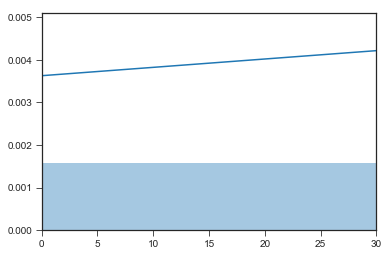

In [29]:
estimated_ferm_time = np.asarray(estimated_ferm_time)
estimated_ferm_time_nonan = estimated_ferm_time[~p.isnull(estimated_ferm_time)]

sns.distplot(estimated_ferm_time_nonan)
plt.xlim(0,30)

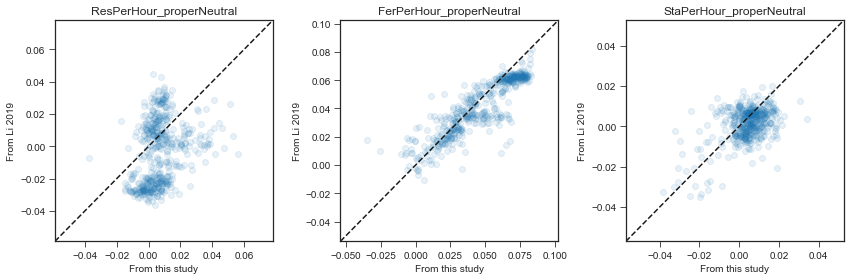

In [34]:
performances = ['ResPerHour_properNeutral','FerPerHour_properNeutral','StaPerHour_properNeutral']

this_set = merged_fitness
this_set = merged_fitness[~merged_fitness['class'].isin(['pure_diploids','neutral_haploids'])]

plt.figure(figsize=(12,4))
for e,performance in enumerate(performances):
    plt.subplot(1,3,e+1)
    plt.title(performance)
    plt.xlabel('From this study')
    plt.ylabel('From Li 2019')
    plt.scatter(this_set[f'{performance}'],this_set[f"{performance.split('_')[0]}_Li2019"],alpha=0.1)
    
    ymin,ymax = plt.ylim()
    xmin,xmax = plt.xlim()
    
    bigmin = np.min([ymin,xmin])
    bigmax = np.max([ymax,xmax])
    
    plt.ylim(bigmin,bigmax)
    plt.xlim(bigmin,bigmax)
    
    plt.plot([bigmin,bigmax],[bigmin,bigmax],'k--')
    plt.tight_layout()
    
# plt.savefig('performances_here_vs_Li2019.pdf',bbox_inches='tight')


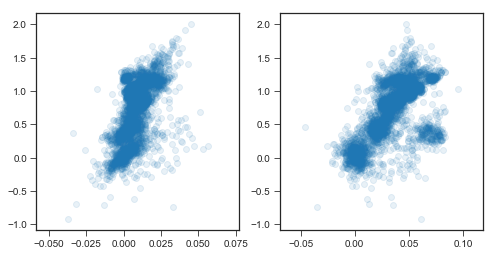

In [37]:
performances = ['ResPerHour_properNeutral','FerPerHour_properNeutral','StaPerHour_properNeutral']

this_set = merged_fitness
this_set = merged_fitness[~merged_fitness['class'].isin(['pure_diploids','neutral_haploids'])]

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.scatter(this_set[f'ResPerHour_properNeutral'],this_set[f"Fit2D_fitness"],alpha=0.1)

plt.subplot(1,2,2)
plt.scatter(this_set[f'FerPerHour_properNeutral'],this_set[f"Fit2D_fitness"],alpha=0.1)
    
# ymin,ymax = plt.ylim()
# xmin,xmax = plt.xlim()

# bigmin = np.min([ymin,xmin])
# bigmax = np.max([ymax,xmax])

# plt.ylim(bigmin,bigmax)
# plt.xlim(bigmin,bigmax)

# plt.plot([bigmin,bigmax],[bigmin,bigmax],'k--')
# plt.tight_layout()
    
# plt.savefig('performances_here_vs_Li2019.pdf',bbox_inches='tight')

In [ ]:
this_set[f"Fit2D_fitness"]

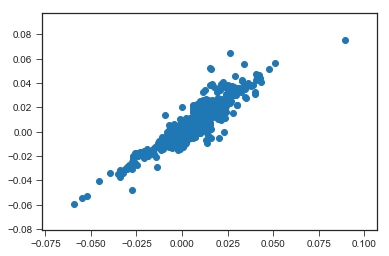

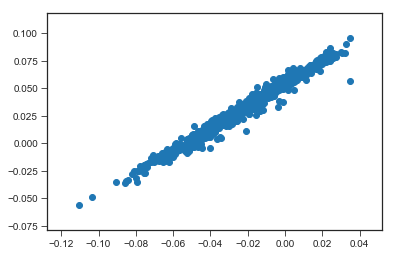

In [120]:
these = nonan_merged[nonan_merged['source_publication_x']=='Li2019']

plt.scatter(these['ResPerHour'].values,these['ResPerHour_LiNeutrals'].values)
plt.figure()
plt.scatter(these['FerPerHour'].values,these['FerPerHour_LiNeutrals'].values)

In [78]:
fitness_df

,Fit1D-R1_error,Fit1D-R1_fitness,Fit1D-R2_error,Fit1D-R2_fitness,Fit1D-R3_error,Fit1D-R3_fitness,Fit2D-R1_error,Fit2D-R1_fitness,Fit2D-R2_error,Fit2D-R2_fitness,...,Fit1D_error,Fit2D_fitness,Fit2D_error,Fit3D_fitness,Fit3D_error,Fit5D_fitness,Fit5D_error,ResPerHour,FerPerHour,StaPerHour
0,0.039749,1.014569,0.039753,1.026117,0.039752,1.017752,0.059465,1.514985,0.059464,1.553292,...,0.013250,1.515793,0.019822,1.678262,0.039733,1.582157,0.059763,0.020680,0.058548,-0.002002
1,0.039953,0.684407,0.039985,0.695791,0.039966,0.700061,0.059494,1.561770,0.059494,1.542261,...,0.013323,1.568898,0.019831,1.901289,0.039738,2.933739,0.059759,0.036478,0.034219,0.021509
2,0.039820,0.788187,0.039833,0.805517,0.039830,0.806607,0.059472,1.506712,0.059472,1.556553,...,0.013276,1.519933,0.019824,1.823625,0.039734,2.340860,0.059759,0.029993,0.042508,0.010776
3,0.039812,0.907575,0.039831,0.929910,0.039804,0.991588,0.059489,1.294069,0.059487,1.397092,...,0.013272,1.397216,0.019828,1.807566,0.039738,0.469608,0.060460,0.018924,0.054208,-0.027874
4,0.039798,0.986055,0.039806,1.036586,0.039798,1.059314,0.059476,1.514415,0.059476,1.574225,...,0.013267,1.558398,0.019825,2.071675,0.039737,2.969530,0.059759,0.022128,0.058675,0.018705
5,0.039824,0.951604,0.039855,0.967447,0.039845,0.966251,0.059475,1.711583,0.059474,1.783003,...,0.013280,1.744947,0.019825,2.289594,0.039738,3.324642,0.059759,0.032633,0.051952,0.021563
6,0.039861,0.867812,0.039880,0.910764,0.039859,0.941033,0.059474,1.757831,0.059479,1.738757,...,0.013289,1.786823,0.019825,2.342568,0.039736,3.699445,0.059758,0.036679,0.047489,0.028268
7,0.039854,1.172167,0.039873,1.208094,0.039847,1.244815,0.059477,1.600838,0.059477,1.685712,...,0.013286,1.670894,0.019825,2.231772,0.039739,2.080458,0.059768,0.019272,0.070704,-0.003152
8,0.039909,0.956645,0.039929,1.003871,0.039911,1.031732,0.059497,1.586250,0.059498,1.617138,...,0.013305,1.629827,0.019832,2.086778,0.039745,3.254056,0.059760,0.026351,0.055751,0.024318
9,0.040189,0.696916,0.040304,0.656784,0.040178,0.712597,0.059612,1.215108,0.059609,1.215747,...,0.013408,1.230875,0.019867,1.518694,0.039760,1.611619,0.059802,0.022587,0.037403,0.001936


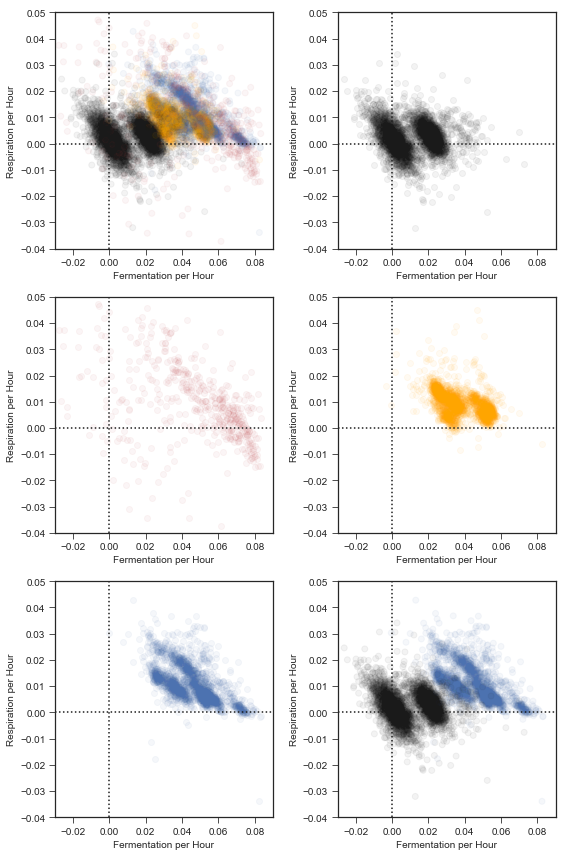

In [54]:
color_map = {'This_study':'b','Li2019':'r','Aggeli2020':'orange','Venkataram2015':'k'}

colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in merged_fitness['source_publication']]
# colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in nonan_merged['source_publication_x']]



xlabel = 'Fermentation per Hour'
ylabel = 'Respiration per Hour'
xdata = 'FerPerHour'
ydata = 'ResPerHour'
xdata = 'FerPerHour_properNeutral'
ydata = 'ResPerHour_properNeutral'

xlim = [-0.03,0.09]
ylim = [-0.04,0.05]

publication_list = [['This_study','Li2019','Aggeli2020','Venkataram2015'],['Venkataram2015'],['Li2019'],['Aggeli2020'],['This_study'],['Venkataram2015','This_study']] 

plt.figure(figsize=(8,12))

for p,pubs in enumerate(publication_list):
    plt.subplot(3,2,p+1)
    
    this_data = merged_fitness[merged_fitness['source_publication'].isin(pubs)]
#     this_data = nonan_merged[nonan_merged['source_publication_x'].isin(pubs)]

    colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in this_data['source_publication']]
    
    if len(pubs) > 1:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=colors)
    else:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=color_map[pubs[0]])

    plt.xlim(xlim[0],xlim[1])
    plt.ylim(ylim[0],ylim[1])

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.axvline(0,color='k',linestyle=':')
    plt.axhline(0,color='k',linestyle=':')


plt.tight_layout()
plt.savefig('tradeoffs_Ferm_Resp.pdf',bbox_inches='tight')



In [44]:
np.unique(merged_fitness['source_publication'].values,return_count=True)

NameError: name 'merged_fitness' is not defined

No handles with labels found to put in legend.


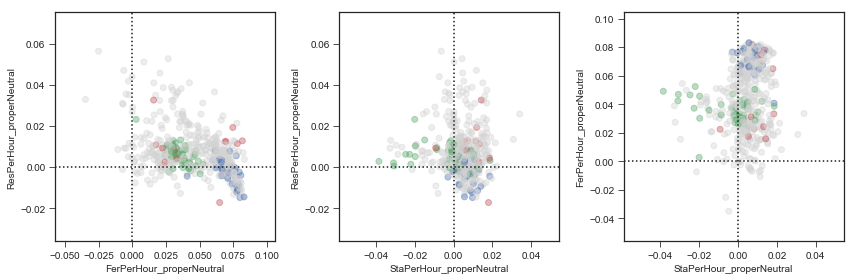

In [52]:
gene_colors = {'IRA1':'g','IRA2':'g','PDE2':'g','GPB2':'g','RAS2':'g','CYR1':'g','TOR1':'g',
              'SXM1':'b',
              'HOG1':'r','FPK1':'r','Diploid + Chr11Amp':'r'}

this_data = merged_fitness[merged_fitness['source_publication'].isin(['Venkataram2015','Li2019'])]
# this_data = this_data[this_data['ploidy']!='Diploid']
this_data = this_data[~this_data['class'].isin(['neutral_haploids','pure_diploids',np.nan])]

performances = ['ResPerHour_properNeutral','FerPerHour_properNeutral','StaPerHour_properNeutral']

# xdata = 'FerPerHour_properNeutral'
# ydata = 'ResPerHour_properNeutral'
colors = [gene_colors[gene] if gene in gene_colors.keys() else 'lightgray' for gene in this_data['gene'].values]

plt.figure(figsize=(12,4))

for subfig,(ydata,xdata) in enumerate(combinations(performances,2)):
    plt.subplot(1,3,subfig+1)
    plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.4,color=colors)

#     plt.xlim(xlim[0],xlim[1])
#     plt.ylim(ylim[0],ylim[1])

    plt.xlabel(xdata)
    plt.ylabel(ydata)

    plt.axvline(0,color='k',linestyle=':')
    plt.axhline(0,color='k',linestyle=':')

plt.legend()
plt.tight_layout()
plt.savefig('tradeoffs_ourData_Li2019style.pdf')



In [53]:
this_set[this_set['gene']=='IRA1']

,Fit1D-R1_error,Fit1D-R1_fitness,Fit1D-R2_error,Fit1D-R2_fitness,Fit1D-R3_error,Fit1D-R3_fitness,Fit2D-R1_error,Fit2D-R1_fitness,Fit2D-R2_error,Fit2D-R2_fitness,...,Fit5D_error_Li2019Neutrals,ResPerHour,FerPerHour,StaPerHour,ResPerHour_Li2019Neutrals,FerPerHour_Li2019Neutrals,StaPerHour_Li2019Neutrals,ResPerHour_properNeutral,FerPerHour_properNeutral,StaPerHour_properNeutral
137,0.045728,0.645321,0.046786,0.630777,0.046976,0.585358,0.067766,0.765069,0.066971,0.773281,...,0.063811,0.006057,0.037281,-0.001250,0.008412,0.088250,-0.001788,0.006057,0.037281,-0.001250
188,0.046712,0.622554,0.047300,0.690177,0.047083,0.660006,0.068062,0.904798,0.067392,0.920994,...,0.072137,0.010894,0.038366,-0.010668,0.013488,0.089135,-0.010173,0.010894,0.038366,-0.010668
296,0.050303,0.569304,0.052075,0.572982,0.051067,0.551819,0.074034,0.826337,0.071956,0.914721,...,0.068169,0.012366,0.032201,0.001305,0.015505,0.081739,-0.001566,0.012366,0.032201,0.001305
923,0.050016,0.750312,0.050555,0.798429,0.049634,0.810844,0.068496,0.949308,0.067992,1.002271,...,0.067757,0.008066,0.047143,-0.002789,0.010681,0.097403,-0.003455,0.008066,0.047143,-0.002789
980,0.056408,0.549149,0.063005,0.484617,0.058321,0.583520,0.081556,0.857735,0.082152,0.828510,...,0.072652,0.012865,0.030570,-0.001507,0.016347,0.079500,-0.001367,0.012865,0.030570,-0.001507
1226,0.055565,0.566361,0.060007,0.525532,0.058166,0.546540,0.084708,0.728581,0.084208,0.708073,...,0.068167,0.006437,0.032557,0.002954,0.008960,0.083790,0.002243,0.006437,0.032557,0.002954
3512,0.064291,0.653878,0.070837,0.687496,0.067630,0.634003,0.101129,0.729774,0.101336,0.688881,...,0.080978,0.002201,0.040571,-0.002602,0.008057,0.089852,-0.002949,0.002201,0.040571,-0.002602
4208,0.069360,0.658414,0.068936,0.690508,0.067068,0.706912,0.095187,0.709059,0.091020,0.757241,...,0.163246,0.002084,0.042325,-0.031002,0.004044,0.091638,-0.034501,0.002084,0.042325,-0.031002
4836,0.072656,0.660318,0.088454,0.607208,0.073030,0.737721,0.097239,0.879279,0.101873,0.728168,...,0.194401,0.008512,0.039883,-0.008701,0.010214,0.089288,-0.008847,0.008512,0.039883,-0.008701
5415,0.057437,0.792755,0.063145,0.750127,0.060805,0.758652,0.082460,0.975683,0.080570,0.994307,...,0.067394,0.009361,0.045653,0.002942,0.008330,0.097919,0.003044,0.009361,0.045653,0.002942


In [257]:
this_data[this_data[ydata]>0.03][['gene','source_publication',ydata,'Fit2D_error']]

,gene,source_publication,ResPerHour_properNeutral,Fit2D_error
5090,NotSequenced,Li2019,0.035205,0.068665
6081,NotSequenced,Li2019,0.044049,0.055862
7226,NotSequenced,Li2019,0.032945,0.212966
7264,NotSequenced,Li2019,0.034974,0.064672
7645,XI,Li2019,0.035613,0.095805
7793,NotSequenced,Li2019,0.036672,0.068714
7921,NotSequenced,Li2019,0.031020,0.131041
8301,NotSequenced,Li2019,0.038880,0.083812
8312,NotSequenced,Li2019,0.032393,0.063574
8358,other,Li2019,0.032489,0.119687


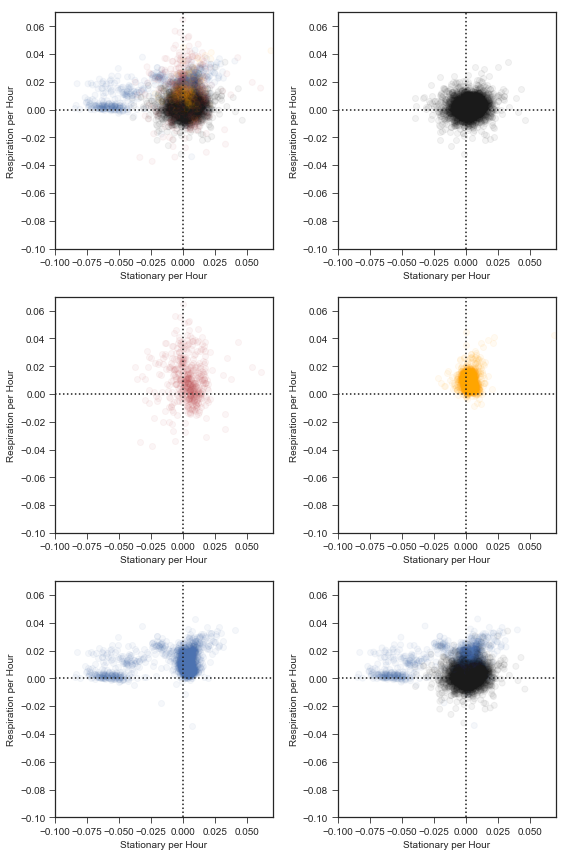

In [61]:
color_map = {'This_study':'b','Li2019':'r','Aggeli2020':'orange','Venkataram2015':'k'}

colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in fitness_df['source_publication']]

xlabel = 'Stationary per Hour'
ylabel = 'Respiration per Hour'
# xdata = 'StaPerHour'
# ydata = 'ResPerHour'
xdata = 'StaPerHour_properNeutral'
ydata = 'ResPerHour_properNeutral'

xlim = [-0.1,0.07]
ylim = [-0.1,0.07]

publication_list = [['This_study','Li2019','Aggeli2020','Venkataram2015'],['Venkataram2015'],['Li2019'],['Aggeli2020'],['This_study'],['Venkataram2015','This_study']] 

plt.figure(figsize=(8,12))

for p,pubs in enumerate(publication_list):
    plt.subplot(3,2,p+1)
    
#     this_data = fitness_df[fitness_df['source_publication'].isin(pubs)]
    this_data = merged_fitness[merged_fitness['source_publication'].isin(pubs)]
    
    colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in this_data['source_publication']]


    
    if len(pubs) > 1:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=colors)
    else:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=color_map[pubs[0]])

    plt.xlim(xlim[0],xlim[1])
    plt.ylim(ylim[0],ylim[1])

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.axvline(0,color='k',linestyle=':')
    plt.axhline(0,color='k',linestyle=':')


plt.tight_layout()
plt.savefig('tradeoffs_sta_Resp.pdf',bbox_inches='tight')




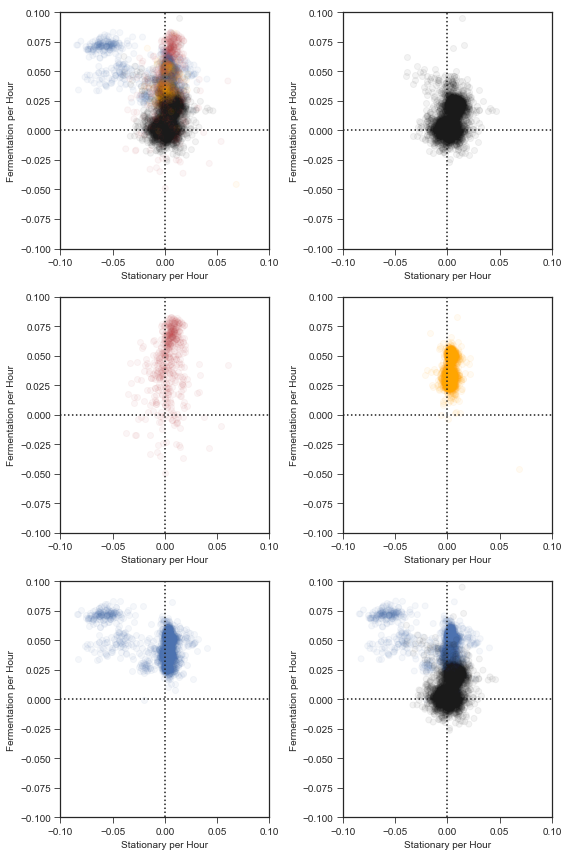

In [62]:
color_map = {'This_study':'b','Li2019':'r','Aggeli2020':'orange','Venkataram2015':'k'}

colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in fitness_df['source_publication']]

xlabel = 'Stationary per Hour'
ylabel = 'Fermentation per Hour'
xdata = 'StaPerHour'
ydata = 'FerPerHour'
xdata = 'StaPerHour_properNeutral'
ydata = 'FerPerHour_properNeutral'



xlim = [-0.1,0.1]
ylim = [-0.1,0.1]

publication_list = [['This_study','Li2019','Aggeli2020','Venkataram2015'],['Venkataram2015'],['Li2019'],['Aggeli2020'],['This_study'],['Venkataram2015','This_study']] 

plt.figure(figsize=(8,12))

for p,pubs in enumerate(publication_list):
    plt.subplot(3,2,p+1)
    
#     this_data = fitness_df[fitness_df['source_publication'].isin(pubs)]
    this_data = merged_fitness[merged_fitness['source_publication'].isin(pubs)]
    colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in this_data['source_publication']]


    if len(pubs) > 1:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=colors)
    else:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=color_map[pubs[0]])

    plt.xlim(xlim[0],xlim[1])
    plt.ylim(ylim[0],ylim[1])

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.axvline(0,color='k',linestyle=':')
    plt.axhline(0,color='k',linestyle=':')


plt.tight_layout()
plt.savefig('tradeoffs_sta_ferm.pdf',bbox_inches='tight')




In [68]:
merged_fitness[merged_fitness['source_publication']=='This_study']['ancestor'].values

array([nan, nan, nan, ..., nan, nan, nan], dtype=object)

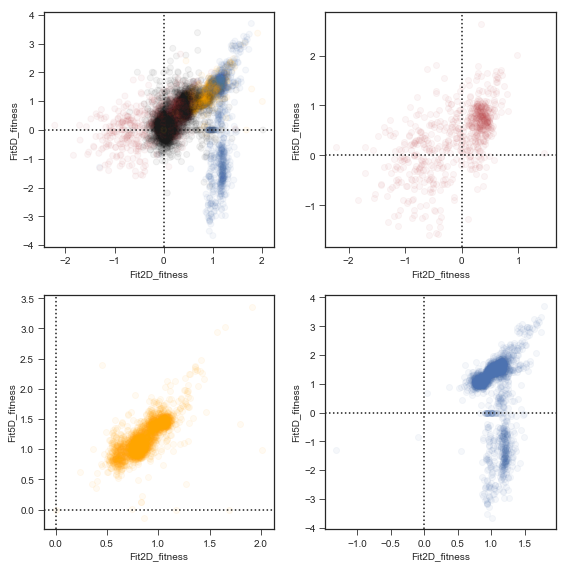

In [84]:
color_map = {'This_study':'b','Li2019':'r','Aggeli2020':'orange','Venkataram2015':'k'}

colors = ['b' if source=='This_study' else 'r' if source=='Li2019' else 'orange' if source == 'Aggeli2020' else 'k' for source in fitness_df['source_publication']]

xlabel = 'Fit2D_fitness'
ylabel = 'Fit5D_fitness'
xdata = 'Fit2D_fitness'
ydata = 'Fit5D_fitness'

# xlim = [-0.02,0.09]
# ylim = [-0.02,0.09]

publication_list = [['This_study','Li2019','Aggeli2020','Venkataram2015'],['Li2019'],['Aggeli2020'],['This_study']] 

plt.figure(figsize=(8,8))

for p,pubs in enumerate(publication_list):
    plt.subplot(2,2,p+1)
    
    this_data = fitness_df[fitness_df['source_publication'].isin(pubs)]
    
    if len(pubs) > 1:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=colors)
    else:
        plt.scatter(this_data[xdata].values,this_data[ydata].values,alpha=0.05,color=color_map[pubs[0]])

#     plt.xlim(xlim[0],xlim[1])
#     plt.ylim(ylim[0],ylim[1])

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.axvline(0,color='k',linestyle=':')
    plt.axhline(0,color='k',linestyle=':')


plt.tight_layout()




In [64]:
new_lowcomplexity_dict['EVO1D_IRA1_MIS'] + new_lowcomplexity_dict['EVO2D_IRA1_MIS'] + new_lowcomplexity_dict['EVO3D_IRA1_MIS']

AttributeError: 'list' object has no attribute 'values'

In [68]:
ira1_mis = merged_fitness[merged_fitness['barcode_lowcomplexity'].isin(new_lowcomplexity_dict['EVO1D_IRA1_MIS'] + 
                                                            new_lowcomplexity_dict['EVO2D_IRA1_MIS'] + 
                                                            new_lowcomplexity_dict['EVO3D_IRA1_MIS'])]

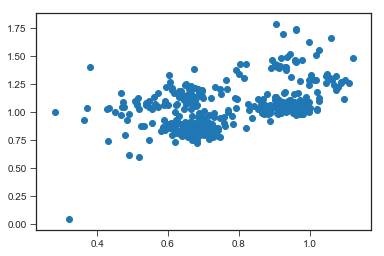

In [71]:
plt.scatter(ira1_mis['Fit1D_fitness'],ira1_mis['Fit2D_fitness'])

In [87]:
fitness_df[(fitness_df['Fit2D_fitness']>1.5) &(fitness_df['Fit5D_fitness']>1.5)][['Fit1D_fitness','Fit2D_fitness','Fit5D_fitness']]

,Fit1D_fitness,Fit2D_fitness,Fit5D_fitness
0,1.019479,1.515793,1.582157
1,0.693418,1.568898,2.933739
2,0.800103,1.519933,2.340860
4,1.027318,1.558398,2.969530
5,0.961765,1.744947,3.324642
6,0.906536,1.786823,3.699445
7,1.208361,1.670894,2.080458
8,0.997414,1.629827,3.254056
13,0.960479,1.735549,2.798507
18,0.716677,1.651888,3.022997


In [127]:
## DOWNSAMPLE TO FIT3d COVERAGE



remove_swaps = True
weighted = True
save_output = True


save_for_later_dict = {}

cov_thresh = 10**6

fitnesses = {}

cols_to_remove = []

for condition in ['Fit1D','Fit2D']:
    rep_times = {}
    r_timepoints = []
    for rep in replicates:
        
        these_times = [f'{condition}-T0'] + [f'{condition}-R{rep}-T{t}' for t in range(1,5)]
        timepoints = [t for t in range(5)]
        
                    
        r_timepoints.append(timepoints)
        
        
        fit3d_coverages = np.sum(bc_counts[[f'Fit3D-T0'] + [f'Fit3D-R{rep}-T{t}' for t in range(1,5)]].values,axis=0)
        
        down_sampled_counts = np.zeros(np.shape(bc_counts[these_times].values))
        for t in range(len(timepoints)):
            down_sampled_counts[:,t] = np.random.multinomial(fit3d_coverages[t],bc_counts[these_times].values[:,t]/np.sum(bc_counts[these_times].values[:,t]))
        
        rep_times[rep] = np.nan_to_num(down_sampled_counts,0)
        
        for entry in these_times:
            cols_to_remove.append(entry)
        
        print(f'{condition}-R{rep}')
        print(np.sum(rep_times[rep],axis=0))
    print(f'{condition}')
    answer = atish.inferFitness(bc_counts['BCID'].values,timepoints,rep_times,
                                neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=False,useMultNoise=True,weightedMean=weighted)
    
    
    for rep in replicates:
        save_for_later_dict[rep] = answer[rep]

    for rep in replicates:
        
        fitnesses[f'{condition}-R{rep}_fitness'] = answer[rep]['aveFitness']
        fitnesses[f'{condition}-R{rep}_error'] = answer[rep]['aveError']


fitness_df_downsample = p.DataFrame(fitnesses)
fitness_df_downsample = fitness_df_downsample.replace([np.inf, -np.inf], np.nan)

for col in [column for column in bc_counts.columns if column not in cols_to_remove]:
    fitness_df[col] = bc_counts[col].values

for condition in ['Fit1D','Fit2D']:
    
    fitness_df_downsample[f'{condition}_fitness'] = np.nansum([fitness_df_downsample[f'{condition}-R{rep}_fitness'].values/fitness_df[f'{condition}-R{rep}_error'].values for rep in replicates],axis=0) \
    /np.nansum([1.0/fitness_df_downsample[f'{condition}-R{rep}_error'].values for rep in replicates],axis=0)
    
    fitness_df_downsample[f'{condition}_error'] = np.nansum([1.0/fitness_df_downsample[f'{condition}-R{rep}_error'].values for rep in replicates],axis=0)**(-1)


# fitness_df = fitness_df[[col for col in fitness_df if col not in other_info]]



Fit1D-R1
[   4528. 1204129. 3389083. 3744835. 2928134.]
Fit1D-R2
[   4528. 3770966. 2181673. 3080492. 3958552.]
Fit1D-R3
[   4528. 2341288. 2380862. 4421386. 4024136.]
Fit1D


/Users/grantkinsler/Documents/Stanford/Research/EvolvingFront/FitnessMeasurements/fitness_assay_grantedits.py:226: RuntimeWarning: divide by zero encountered in power
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/EvolvingFront/FitnessMeasurements/fitness_assay_grantedits.py:226: RuntimeWarning: invalid value encountered in multiply
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/EvolvingFront/FitnessMeasurements/fitness_assay_grantedits.py:396: RuntimeWarning: divide by zero encountered in log
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/EvolvingFront/FitnessMeasurements/fitness_assay_grantedits.py:396: RuntimeWarning: invalid value encountered in subtract
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users

Multiplicative noise consistency checks

1  inconsistent times:

kappas [3.30627514 2.56924031 1.94614789]
multNoise [0.10525192 0.10009914 0.07447339]
No clear inconsistencies


2  inconsistent times:

kappas [14.5420033   5.44829926  3.07772912]
multNoise [0.10525192 0.10009914 0.07447339]
No clear inconsistencies


3  inconsistent times:

kappas [2.05232913 2.86524227 2.33117551]
multNoise [0.10525192 0.10009914 0.07447339]
No clear inconsistencies

Fit2D-R1
[   4528. 1204129. 3389083. 3744835. 2928134.]
Fit2D-R2
[   4528. 3770966. 2181673. 3080492. 3958552.]
Fit2D-R3
[   4528. 2341288. 2380862. 4421386. 4024136.]
Fit2D
Multiplicative noise consistency checks

1  inconsistent times:

kappas [2.94076473 1.74766707 1.58933461]
multNoise [0.16200716 0.25853211 0.1278444 ]
No clear inconsistencies


2  inconsistent times:

kappas [1.58271672 1.71627163 1.88674202]
multNoise [0.16200716 0.25853211 0.1278444 ]
No clear inconsistencies


3  inconsistent times:

kappas [1.87419912 2.1719047

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:67: RuntimeWarning: divide by zero encountered in reciprocal


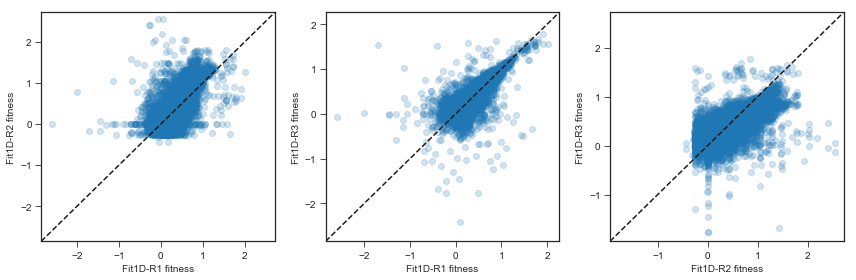

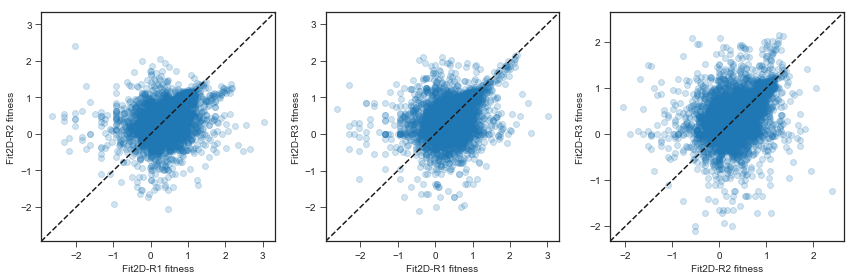

In [128]:
for condition in ['Fit1D','Fit2D']:
    plt.figure(figsize=(12,4))
    for i,(rep1,rep2) in enumerate(combinations(replicates,2)):
        plt.subplot(1,3,i+1)
        plt.scatter(fitness_df_downsample[f'{condition}-R{rep1}_fitness'].values,fitness_df_downsample[f'{condition}-R{rep2}_fitness'].values,alpha=0.2)
        plt.xlabel(f'{condition}-R{rep1} fitness')
        plt.ylabel(f'{condition}-R{rep2} fitness')
        
        xmin,xmax = plt.xlim()
        ymin,ymax = plt.ylim()
        new_min = np.min([xmin,ymin])
        new_max = np.max([xmax,ymax])

        plt.xlim(new_min,new_max)
        plt.ylim(new_min,new_max)
        plt.plot([new_min,new_max],[new_min,new_max],'k--')
        plt.tight_layout()
        
    plt.savefig(f'{condition}_DOWNSAMPLE_replicate_correlation.pdf',bbox_inches='tight')

In [123]:
np.random.multinomial(100000,bc_counts[these_times].values[:,0]/np.sum(bc_counts[these_times].values[:,0]))

array([9048, 3738, 2194, ...,   12,    0,    0])

In [125]:
np.sum(bc_counts[[f'Fit3D-T0'] + [f'Fit3D-R{rep}-T{t}' for t in range(1,5)]].values,axis=0)

array([   4528, 2341288, 2380862, 4421386, 4024136])

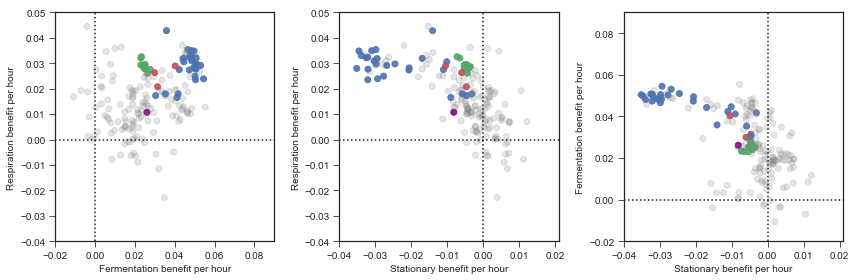

In [17]:
import matplotlib
these = fitness_df[(fitness_df['class']!='neutral_haploids') & (fitness_df['class']!='pure_diploids')]
these = these[these['evolution_condition']=='Evo2D']

colors = [matplotlib.colors.to_rgba('b',alpha=0.9) if gene == 'IRA1' 
          else matplotlib.colors.to_rgba('g',alpha=0.9) if gene == 'GPB2'
          else matplotlib.colors.to_rgba('purple',alpha=0.9) if gene == 'TOR1'
          else matplotlib.colors.to_rgba('r',alpha=0.9) if gene == 'CYR1' 
          else matplotlib.colors.to_rgba('gray',alpha=0.2) for gene in these['gene'].values ]


plt.figure(figsize=(12,4))
plt.subplot(131)
plt.scatter(these['FerPerHour_Li2019'],these['ResPerHour_Li2019'],color=colors)

plt.xlim(-0.02,0.09)
plt.ylim(-0.04,0.05)

plt.xlabel('Fermentation benefit per hour')
plt.ylabel('Respiration benefit per hour')

# plt.axhline(np.max(these['ResPerHour_Li2019']),color='r',linestyle='--')
# plt.axvline(np.max(these['FerPerHour_Li2019']),color='r',linestyle='--')

plt.axhline(0,color='k',linestyle=':')
plt.axvline(0,color='k',linestyle=':')

plt.subplot(132)
plt.scatter(these['StaPerHour_Li2019'],these['ResPerHour_Li2019'],color=colors)


plt.xlabel('Stationary benefit per hour')
plt.ylabel('Respiration benefit per hour')

# plt.axhline(np.max(these['StaPerHour_Li2019']),color='r',linestyle='--')
# plt.axvline(np.max(these['ResPerHour_Li2019']),color='r',linestyle='--')

plt.axhline(0,color='k',linestyle=':')
plt.axvline(0,color='k',linestyle=':')

plt.xlim(-0.04,0.021)
plt.ylim(-0.04,0.05)



plt.subplot(133)
plt.scatter(these['StaPerHour_Li2019'],these['FerPerHour_Li2019'],color=colors)

plt.xlabel('Stationary benefit per hour')
plt.ylabel('Fermentation benefit per hour')

# plt.axhline(np.max(these['StaPerHour_Li2019']),color='r',linestyle='--')
# plt.axvline(np.max(these['FerPerHour_Li2019']),color='r',linestyle='--')

plt.axhline(0,color='k',linestyle=':')
plt.axvline(0,color='k',linestyle=':')

plt.xlim(-0.04,0.021)
plt.ylim(-0.02,0.09)

plt.tight_layout()
plt.savefig('ParetoFront_original_just2day_genes.pdf',bbox_inches='tight')



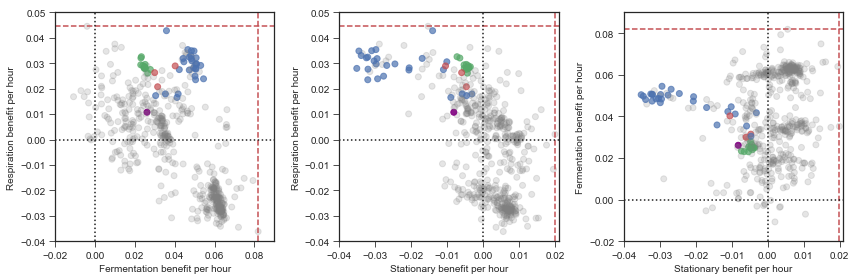

In [20]:

these = fitness_df[(fitness_df['class']!='neutral_haploids') & (fitness_df['class']!='pure_diploids')]


colors = ['orange' if condition == 'Evo2D' 
          else 'purple' if condition =='Evo1D'
          else 'b' if condition == 'Evo5D'
          else 'g' if condition == 'Evo1/5D' 
          else 'g' for condition in these['evolution_condition'].values ]
colors = [matplotlib.colors.to_rgba('b',alpha=0.7) if gene == 'IRA1' 
          else matplotlib.colors.to_rgba('g',alpha=0.7) if gene == 'GPB2'
          else matplotlib.colors.to_rgba('purple',alpha=0.9) if gene == 'TOR1'
          else matplotlib.colors.to_rgba('r',alpha=0.7) if gene == 'CYR1' 
          else matplotlib.colors.to_rgba('gray',alpha=0.2) for gene in these['gene'].values ]




plt.figure(figsize=(12,4))
plt.subplot(131)
plt.scatter(these['FerPerHour_Li2019'],these['ResPerHour_Li2019'],color=colors)

plt.xlim(-0.02,0.09)
plt.ylim(-0.04,0.05)

plt.xlabel('Fermentation benefit per hour')
plt.ylabel('Respiration benefit per hour')

plt.axhline(np.max(these['ResPerHour_Li2019']),color='r',linestyle='--')
plt.axvline(np.max(these['FerPerHour_Li2019']),color='r',linestyle='--')

plt.axhline(0,color='k',linestyle=':')
plt.axvline(0,color='k',linestyle=':')

plt.subplot(132)
plt.scatter(these['StaPerHour_Li2019'],these['ResPerHour_Li2019'],color=colors)


plt.xlabel('Stationary benefit per hour')
plt.ylabel('Respiration benefit per hour')

plt.axvline(np.max(these['StaPerHour_Li2019']),color='r',linestyle='--')
plt.axhline(np.max(these['ResPerHour_Li2019']),color='r',linestyle='--')

plt.axhline(0,color='k',linestyle=':')
plt.axvline(0,color='k',linestyle=':')

plt.xlim(-0.04,0.021)
plt.ylim(-0.04,0.05)



plt.subplot(133)
plt.scatter(these['StaPerHour_Li2019'],these['FerPerHour_Li2019'],color=colors)

plt.xlabel('Stationary benefit per hour')
plt.ylabel('Fermentation benefit per hour')

plt.axvline(np.max(these['StaPerHour_Li2019']),color='r',linestyle='--')
plt.axhline(np.max(these['FerPerHour_Li2019']),color='r',linestyle='--')

plt.axhline(0,color='k',linestyle=':')
plt.axvline(0,color='k',linestyle=':')

plt.xlim(-0.04,0.021)
plt.ylim(-0.02,0.09)

plt.tight_layout()
plt.savefig('ParetoFront_original_genecolors.pdf',bbox_inches='tight')


In [84]:
fitness_df['evolution_condition'].values[2000:3000]

array(['Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D', 'Evo2D',
       'Evo2D', 'Evo

In [71]:
merged_fitness.columns

Index(['Fit1D-R1_error', 'Fit1D-R1_fitness', 'Fit1D-R2_error',
       'Fit1D-R2_fitness', 'Fit1D-R3_error', 'Fit1D-R3_fitness',
       'Fit2D-R1_error', 'Fit2D-R1_fitness', 'Fit2D-R2_error',
       'Fit2D-R2_fitness',
       ...
       'Fit5D_error_Li2019Neutrals', 'ResPerHour', 'FerPerHour', 'StaPerHour',
       'ResPerHour_Li2019Neutrals', 'FerPerHour_Li2019Neutrals',
       'StaPerHour_Li2019Neutrals', 'ResPerHour_properNeutral',
       'FerPerHour_properNeutral', 'StaPerHour_properNeutral'],
      dtype='object', length=290)

In [ ]:
merged